# COVID-19 Exploratory Data Analysis and Visualization

# Dhruvil Sojitra-202362003

# Context

The outbreak of coronavirus occured in a market for illegal wildlife in Wuhan (China). On December 31, 2019, Chinese officials informed the first case of COVID-19. On January, 31, 2020, the US, the UK, South Korea, Italy, Vietnam, and many more reported their first COVID-19 cases. The economic and social disruption caused by the pandemic is devastating: 

- Tens of millions of people are at risk of falling into extreme poverty by health spending.
- More than 160 countries had mandated some form of school closures for at least 1.5 billion children and youth.
- Digital connectivity is now a necessity because of the pandemic and associated lockdowns.
- The COVID-19 recession has seen the fastest, steepest downgrades in consensus growth projections among all global recessions since 1990. [According to Worldbank]

The impact of COVID-19 can be compared with the impact og Global Financial crisis of 2007-2008 or World War II or many other crises we know only from the history books.

Around the end of January, 2021, the world exceeded 101 millions of cases and 2 millions of deaths. The cases still continue to rise in the future. 



# Data Collection

Data was acquired by downloading from Johns Hopkins University (the CSSEGI):
 - Confirmed Cases Dataset (global)
 - Deaths Dataset (global)
 


# Objective

Derive interesting data insights on Covid-19 and visualize the outbreak of Coronavirus at different level:

  1. Global 
  2. Country 
  3. Geographical Map
  4. Top 10 Country
  5. Fatality Rate
  6. Worldwide Detail Report Since the Early Stage of Pandemic Till Now
  7. Timeline Analysis:
       - Global Level
       - US vs. The Rest of The World
       - Vietnam
       - Compare the situation between US & Vietnam
       
I hope this analysis will give you inspirations on the topic.
 

# Pipeline

 - Download the dataset
 - Clean and consolidate the data
 - Perform exploratory analysis (EDA)
 - Transform data into different types of dataframe and engineer new features for further study and visualizations



# Feature Engineering

For the purpose of the data, there are new variables were created:
- New cases
- New Deaths
- 7 days rolling average of new cases and new deaths
- Month, Day, Month-Year 



# Insights

- Top 10 worst affected countries are United States, India, Brazil, Russia, United Kingdom, France, Spain, Italy, Turkey, Germany.


- The global fatality rate for COVID-19 Pandemic is 2.15% by the end of January 2021.


- In the world, Yemen came in the first place with the highest fatality rate (29%) with 612 deaths and 2115 cases. Though MS Zaandam has the second highest fatality rate of 22% but this country has significant small numbers of confirmed cases (9) and  deaths(2). 



- The **United States** accounted for the world's **highest number of cases and deaths** at over 25.6M and 425K as of January 26th, 2020, according to CSSE data. Despite the highest number of deaths, the mortality rate in the US is only 1.67%. **Indian** came in **second place** with 10M infections and 153K deaths.


- In the list of the worst affected countries, **Brazil** came in third with more than 8M confirmed cases. **Russia, United Kingdom and France** came in as the third, fourth, and fifth place with relatively similar numbers of infections, over 3M. **Spain, Italy, Turkey, and Germany**  came in as the last four places in top 10 most infected countries.


- In the list of the most deathly countries, Mexico came in fourth yet the fatality rate, reached 8.5%, of the countries ranked third in the world.


- In the list of the worst infected countries, Italy had the highest fatality rate of 3.48%.


- After 100 infections were confirmed, South Korea, Vietnam, and China quickly flattened the curve while the number of infections in US, Brazil, Russia, Spain, United Kingdom, India, and Germany had a hard time controlling the infections: In less than 50 days after the first 100 cases, all countries had their infections double every day and every 3 day. After 100 days since the first 100 cases, the U.S., Brazil, and India had their cases double every 2 weeks. Vietnam is the only country had their cases double every 2 months after 300 days.


- From November 2020 to 2021, the daily new infections in the U.S. were almost half the total new infections all over the world.

- The U.S. saw a significant spike in new infections and deaths around the end of 2020 (Dec) and the start of 2021 (Jan).


- Vietnam population (96.46M) is approximately one-third of US population (328M), however, the daily new cases in US is 10,000 times higher than the daily new cases in Vietnam. Hence, Vietnam has successfully control of the pandemic in comparison with the U.S.


- Season can play a significant role in the increase of cases as the flu season can cause a second wave. The daily new cases in US reached around 100,000 to 300,000 cases during Winter (November, December, and January). The numbers of daily new cases in Spring, Summer and Fall were mostly less than 100,000.


- The number of daily new cases in Vietnam is mostly less than 20. In the summer of 2020, the number of new cases spiked up to 50 case. This happened because students who studied aboard in European or United States (hot spots of the pandemic) came back to Vietnam or foreigners travelled to Vietnam to avoid the pandemic in their countries. 


________________________________________________________________

# Import packages


In [1]:
# Import the necessary modules
import os
import wget
import pandas as pd
import numpy as np
import json

# Visualization libraries
import matplotlib.pyplot as plt
import pygal
from pygal import Config
from pygal.style import DefaultStyle
import cufflinks as cf
#seaborn: statistical visualization
import seaborn as sns                    
sns.set_style("whitegrid")      

# Map visualization
# folium: choropleth visualization
import folium
# altair: declarative statistical visualization
import altair as alt

# Plotly for interactive visualization
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)   # require to use plotly offline in jupyter notebook
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_white"

import plotly.io as pio              
from IPython.display import Image      # to produce plotly staic image on Github

#pip install svglib
# Configuration for high resolution for rendered images on notebook
%config InlineBackend.figure_format='retina'

from IPython.display import SVG, display
'''Display markdown formatted output like bold, italic bold, ...'''
from IPython.display import Markdown
def bold(string):
    display(Markdown(string))
import warnings

warnings.filterwarnings("ignore")
%matplotlib inline

# Load Data

Download COVID-19 data from John Hopkins University on Github.

In [2]:
# Remove on the downloaded csv files
! del *.csv

# Link urls to the updated data from John Hopkins University
urls = [
    # global confirmed cases
    'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv',
    # global death cases
    'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv']
    # global recovery cases
    
for url in urls:
    file = wget.download(url)

Could Not Find E:\M-TECH\SEM 2\Data Analitics\project\New folder (2)\*.csv


100% [..........................................................................] 1255258 / 1255258

In [3]:
# Double check if the data are in the folder
! dir *.csv

 Volume in drive E is New Volume
 Volume Serial Number is 0489-C3B2

 Directory of E:\M-TECH\SEM 2\Data Analitics\project\New folder (2)

01-05-2024  23:18         1,819,904 time_series_covid19_confirmed_global.csv
01-05-2024  23:18         1,255,258 time_series_covid19_deaths_global.csv
               2 File(s)      3,075,162 bytes
               0 Dir(s)  302,337,662,976 bytes free


In [86]:
# Read the Global Confirmed Cases Dataset
cases = pd.read_csv('time_series_covid19_confirmed_global.csv')
cases

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,703228,703228,703228,703228,703228,703228,703228,703228,703228,703228
285,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,535,535,535,535,535,535,535,535,535,535
286,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,11945,11945,11945,11945,11945,11945,11945,11945,11945,11945
287,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,343012,343012,343079,343079,343079,343135,343135,343135,343135,343135


In [5]:
# Read the Death Dataset
deaths = pd.read_csv('time_series_covid19_deaths_global.csv')
deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,7896,7896,7896,7896,7896,7896,7896,7896,7896,7896
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,3598,3598,3598,3598,3598,3598,3598,3598,3598,3598
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,6881,6881,6881,6881,6881,6881,6881,6881,6881,6881
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,165,165,165,165,165,165,165,165,165,165
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,1933,1933,1933,1933,1933,1933,1933,1933,1933,1933


____________________________________________________________________________

# A bird-view at the data


In [6]:
# Checking the data size
# confirmed cases
print("****GLOBAL CONFIRMED CASES*****")
print("# rows: {}".format(cases.shape[0]))
print("# columns: {}".format(cases.shape[1]))
print("****GLOBAL DEATHS*****")
print("# rows: {}".format(deaths.shape[0]))
print("# columns: {}".format(deaths.shape[1]))

****GLOBAL CONFIRMED CASES*****
# rows: 289
# columns: 1147
****GLOBAL DEATHS*****
# rows: 289
# columns: 1147


In [7]:
# checking columns name
print("****All Columns Global Confirmed Cases****:\n", cases.columns)
print("\n")
print("****All Columns Gobal Deaths****:\n", deaths.columns)

****All Columns Global Confirmed Cases****:
 Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1147)


****All Columns Gobal Deaths****:
 Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1147)


In [8]:
# checking data types
print("Global Confirmed Cases Types:\n", cases.dtypes)
print("\nGlobal Deaths Types:\n", deaths.dtypes)

Global Confirmed Cases Types:
 Province/State     object
Country/Region     object
Lat               float64
Long              float64
1/22/20             int64
                   ...   
3/5/23              int64
3/6/23              int64
3/7/23              int64
3/8/23              int64
3/9/23              int64
Length: 1147, dtype: object

Global Deaths Types:
 Province/State     object
Country/Region     object
Lat               float64
Long              float64
1/22/20             int64
                   ...   
3/5/23              int64
3/6/23              int64
3/7/23              int64
3/8/23              int64
3/9/23              int64
Length: 1147, dtype: object


In [9]:
# Statistical checking for Global Confirmed Cases
cases.describe(include='all')

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
count,91,289,287.000000,287.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,...,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02
unique,91,201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Australian Capital Territory,China,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,19.718719,22.182084,1.927336,2.273356,3.266436,4.972318,7.335640,10.134948,...,2.336755e+06,2.337519e+06,2.338173e+06,2.338805e+06,2.338992e+06,2.339187e+06,2.339387e+06,2.339839e+06,2.340460e+06,2.341073e+06
std,NaN,NaN,25.956609,77.870931,26.173664,26.270191,32.707271,45.523871,63.623197,85.724481,...,8.506608e+06,8.511285e+06,8.514488e+06,8.518031e+06,8.518408e+06,8.518645e+06,8.519346e+06,8.521641e+06,8.524968e+06,8.527765e+06
min,NaN,NaN,-71.949900,-178.116500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,NaN,NaN,4.072192,-32.823050,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04,1.456700e+04
50%,NaN,NaN,21.512583,20.939400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05,1.032480e+05
75%,NaN,NaN,40.401784,89.224350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.051998e+06,1.052122e+06,1.052247e+06,1.052382e+06,1.052519e+06,1.052664e+06,1.052664e+06,1.052926e+06,1.053068e+06,1.053213e+06


In [10]:
# Statistical checking for Global Deaths 
deaths.describe(include='all')

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
count,91,289,287.000000,287.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,...,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02,2.890000e+02
unique,91,201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Australian Capital Territory,China,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,19.718719,22.182084,0.058824,0.062284,0.089965,0.145329,0.193772,0.283737,...,2.378091e+04,2.378707e+04,2.379249e+04,2.379697e+04,2.379793e+04,2.379844e+04,2.379971e+04,2.380290e+04,2.380790e+04,2.381246e+04
std,NaN,NaN,25.956609,77.870931,1.000000,1.001525,1.413797,2.353998,3.060245,4.471644,...,9.337339e+04,9.341836e+04,9.345110e+04,9.347703e+04,9.347884e+04,9.347810e+04,9.348106e+04,9.349767e+04,9.352985e+04,9.355567e+04
min,NaN,NaN,-71.949900,-178.116500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,NaN,NaN,4.072192,-32.823050,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01,6.600000e+01
50%,NaN,NaN,21.512583,20.939400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,9.440000e+02,9.440000e+02,9.520000e+02,9.520000e+02,9.520000e+02,9.520000e+02,9.520000e+02,9.520000e+02,9.520000e+02,9.520000e+02
75%,NaN,NaN,40.401784,89.224350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,8.721000e+03,8.721000e+03,8.721000e+03,8.721000e+03,8.721000e+03,8.721000e+03,8.721000e+03,8.721000e+03,8.727000e+03,8.727000e+03


In [11]:
# Checking Missing Value
print("GLOBAL CONFIRMED CASES")
cases.info()
print(cases.isnull().sum().sort_values(ascending=False))
print("\n GLOBAL DEATH CASES")
deaths.info()
print(deaths.isnull().sum().sort_values(ascending=False))

GLOBAL CONFIRMED CASES
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Columns: 1147 entries, Province/State to 3/9/23
dtypes: float64(2), int64(1143), object(2)
memory usage: 2.5+ MB
Province/State    198
Lat                 2
Long                2
2/19/22             0
2/25/22             0
                 ... 
2/11/21             0
2/12/21             0
2/13/21             0
2/14/21             0
3/9/23              0
Length: 1147, dtype: int64

 GLOBAL DEATH CASES
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289 entries, 0 to 288
Columns: 1147 entries, Province/State to 3/9/23
dtypes: float64(2), int64(1143), object(2)
memory usage: 2.5+ MB
Province/State    198
Lat                 2
Long                2
2/19/22             0
2/25/22             0
                 ... 
2/11/21             0
2/12/21             0
2/13/21             0
2/14/21             0
3/9/23              0
Length: 1147, dtype: int64


___________________________________________________________________________________

# Data Consolidation


To consolidate data, I will:

   - Unpivot Global Confirmed Cases dataset
   - Unpivot Global Deaths Cases dataset
   - Merge Global Confirmed Cases and Global Deaths datasets
     
Recovery dataset number of rows is not similar to other number of rows of other datasets so I will not merge it yet

_In here, I will use `pandas.melt` to unpivot a DataFrame from wide to long format where one or more columns are idenfier variables (*id_vars*), while all other columns are "unvipoted" to the row axis._

In [12]:
# Combine Confirmed & Death Cases

# Extract date data 
date = cases.columns[4:]
# unpivot Global Confirmed Cases dataset
cases_df = cases.melt(id_vars=['Province/State','Country/Region','Lat','Long'],
                      value_vars = date, var_name = 'Date', value_name = 'Confirmed Cases')

# unpivot Gloal Deaths dataset
deaths_df = deaths.melt(id_vars=['Province/State', 'Country/Region','Lat','Long'],
                        value_vars = date, var_name = 'Date', value_name = 'Deaths')
# merged two new data frame
df = pd.concat([cases_df, deaths_df['Deaths']], axis = 1, sort = False)
# Check the data
df.tail()
#df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135,4057
330326,NaN,Zimbabwe,-19.015438,29.154857,3/9/23,264276,5671


In [13]:
# Save the data 
df.to_csv('merged_uncleaned_data.csv')

___

# Data Cleaning

The list of data cleanning tasks:
**1. 'Province/State':**

- Correct the values in 'Province/State'.
- Remove the ',' in Bonaire, Sint Eustatius and Saba to avoid redundancy.

**2.'Country/Region':**

- Fix countries name

**3. Fixing incorrect data in certain date in 'Hubei', China**
- Change the number of confirmed cases on 2/12/2020 from 33366 to 34874	

**4. Fixing incorrect data in certain date in 'Vietnam'**
- Change the number of deaths on 8/18/2020 from 26 to 25	

**5. Convert Date From String to Datetime Type**

## 1. 'Province/State' column Cleaning

In [14]:
print("There are {} unique values for columns 'Province/State'".format(len(df['Province/State'].unique())))
df['Province/State'].unique()

There are 92 unique values for columns 'Province/State'


array([nan, 'Australian Capital Territory', 'New South Wales',
       'Northern Territory', 'Queensland', 'South Australia', 'Tasmania',
       'Victoria', 'Western Australia', 'Alberta', 'British Columbia',
       'Diamond Princess', 'Grand Princess', 'Manitoba', 'New Brunswick',
       'Newfoundland and Labrador', 'Northwest Territories',
       'Nova Scotia', 'Nunavut', 'Ontario', 'Prince Edward Island',
       'Quebec', 'Repatriated Travellers', 'Saskatchewan', 'Yukon',
       'Anhui', 'Beijing', 'Chongqing', 'Fujian', 'Gansu', 'Guangdong',
       'Guangxi', 'Guizhou', 'Hainan', 'Hebei', 'Heilongjiang', 'Henan',
       'Hong Kong', 'Hubei', 'Hunan', 'Inner Mongolia', 'Jiangsu',
       'Jiangxi', 'Jilin', 'Liaoning', 'Macau', 'Ningxia', 'Qinghai',
       'Shaanxi', 'Shandong', 'Shanghai', 'Shanxi', 'Sichuan', 'Tianjin',
       'Tibet', 'Unknown', 'Xinjiang', 'Yunnan', 'Zhejiang',
       'Faroe Islands', 'Greenland', 'French Guiana', 'French Polynesia',
       'Guadeloupe', 'Martiniq

In [15]:
# Correct the values in 'Province/State'
# Remove the ',' in Bonaire, Sint Eustatius and Saba to avoid redundancy
df = df[df['Province/State'].str.contains(',')!=True]
#recovery_df = recovery_df[recovery_df['Province/State'].str.contains(',')!=True]
# Check the number of column again
len(df['Province/State'].unique())

90

## 2. 'Country/Region' column cleaning

In [16]:
#Checking current country names in the dataframe
#df['Country/Region'].unique()

In [17]:
# Changing the country name for using the package 'pycountry_convert'
# !pip install pycountry-convert
# Dictionary of new country name
country_dict = {'Taiwan*': 'Taiwan',
          'US': 'USA',
          'Korea, South':'South Korea',
          'Reunion':'Réunion',
          'Congo (Kinshasa)': 'Democratic Republic of the Congo',
          'Congo (Brazzaville)': 'Republic of the Congo',
          "Cote d'Ivoire": "Côte d'Ivoire",
           'Bahamas, The': 'Bahamas',
           'Gambia, The': 'Gambia'
    }

# Change the old country names with the new country names
for o,n in country_dict.items():
    df['Country/Region']=df['Country/Region'].replace(o,n)

In [18]:
#print(df['Country/Region'].unique())
#print(len(df['Country/Region'].unique()))
# Checking the result
df[df['Country/Region']=='Taiwan'].head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
249,NaN,Taiwan,23.7,121.0,1/22/20,1,0
538,NaN,Taiwan,23.7,121.0,1/23/20,1,0
827,NaN,Taiwan,23.7,121.0,1/24/20,3,0
1116,NaN,Taiwan,23.7,121.0,1/25/20,3,0
1405,NaN,Taiwan,23.7,121.0,1/26/20,4,0


## 4. Fixing incorrect Vietnam data on 8/18/2020

- The correct number of deaths in Vietnam on 8/18/2020 is 25 instead of 26

In [22]:
# Checking the data of Vietnam on 2/12/2020
df[(df['Country/Region']=='Vietnam')&(df['Date']=='8/18/20')]

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
60684,NaN,Vietnam,14.058324,108.277199,8/18/20,989,26


In [23]:
# Create a function to correct the value
def correcting_value(region, date, value_name, correct_value):
    for key, val in correct_value.items():
        df.loc[(df[region]==key)&(df['Date']==date), value_name]=val
        
# Correct Data is 26 deaths
vietnam8182020 = {'Vietnam':25}

# Correct the data
correcting_value('Country/Region','8/18/20','Deaths', vietnam8182020)

In [24]:
# Checking the result
df[(df['Country/Region']=='Vietnam')&(df['Date']=='8/18/20')]

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
60684,NaN,Vietnam,14.058324,108.277199,8/18/20,989,25


## 5. Convert Data From String to Datetime Type

In [25]:
# Convert date from string to datetime type using pd.to_datetime
# Use strftime to sort the date order again (month, date, year) 
df['Date']=pd.to_datetime(df['Date']).dt.strftime('%m/%d/%Y')
df.tail()

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
330322,NaN,West Bank and Gaza,31.952200,35.233200,03/09/2023,703228,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,03/09/2023,535,0
330324,NaN,Yemen,15.552727,48.516388,03/09/2023,11945,2159
330325,NaN,Zambia,-13.133897,27.849332,03/09/2023,343135,4057
330326,NaN,Zimbabwe,-19.015438,29.154857,03/09/2023,264276,5671


In [26]:
df.tail()

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
330322,NaN,West Bank and Gaza,31.952200,35.233200,03/09/2023,703228,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,03/09/2023,535,0
330324,NaN,Yemen,15.552727,48.516388,03/09/2023,11945,2159
330325,NaN,Zambia,-13.133897,27.849332,03/09/2023,343135,4057
330326,NaN,Zimbabwe,-19.015438,29.154857,03/09/2023,264276,5671



### **Save data for further analysis**

In [27]:
df.to_csv('covid19_clean_data.csv')

_______________ ____________
# Exploratory Data Analysis


In [28]:
# Show the statiscal overview of the data
df.describe(include="all")

,Province/State,Country/Region,Lat,Long,Date,Confirmed Cases,Deaths
count,101727,328041,325755.000000,325755.000000,328041,3.280410e+05,3.280410e+05
unique,89,201,NaN,NaN,1143,NaN,NaN
top,Australian Capital Territory,China,NaN,NaN,01/22/2020,NaN,NaN
freq,1143,38862,NaN,NaN,287,NaN,NaN
mean,NaN,NaN,19.842248,22.627552,NaN,9.660530e+05,1.347330e+04
std,NaN,NaN,25.946316,77.792077,NaN,4.882301e+06,6.410434e+04
min,NaN,NaN,-71.949900,-178.116500,NaN,0.000000e+00,0.000000e+00
25%,NaN,NaN,4.210484,-23.041800,NaN,7.100000e+02,3.000000e+00
50%,NaN,NaN,21.521757,21.005900,NaN,1.486200e+04,1.550000e+02
75%,NaN,NaN,40.463667,90.356300,NaN,2.312990e+05,3.064000e+03


In [29]:
print("There are now {} variables and {} records in this dataset".format(df.shape[1],df.shape[0]))

There are now 7 variables and 328041 records in this dataset



# 1. GLOBAL LEVEL

### What are the lastest confirmed cases and deaths in the world?

In [30]:
# Extract the final date of the dataframe
final_date = df.Date.iloc[-1]
# Extract the cases on the final_date
most_recent_df =df[df.Date == final_date]
# Most updated on Global COVID-19 confirmed cases and deaths 
print("Globally COVID-19 information on {}:\n\
      \nConfirmed Cases: {:,}\nDeaths: {:,}".format(final_date, 
                             most_recent_df["Confirmed Cases"].sum(),   # Lastest info about confirmed cases
                             most_recent_df["Deaths"].sum()))           # Lastest info about deaths
                             

Globally COVID-19 information on 03/09/2023:
      
Confirmed Cases: 676,556,179
Deaths: 6,881,761


### An overview of COVID-19 fatality and recovery rate at Global level

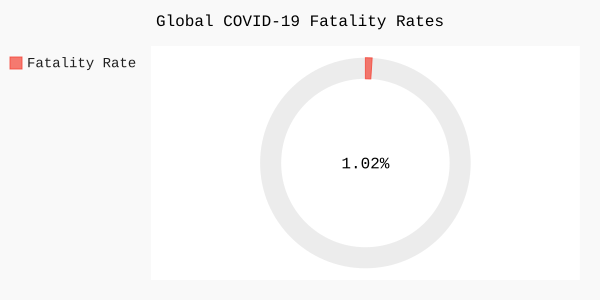

In [31]:
# Calculate global fatality rate
fatality_rate = round((most_recent_df["Deaths"].sum()/ most_recent_df["Confirmed Cases"].sum())*100,2)

# Plot global fatality rate in a gauge chart
gauge = pygal.SolidGauge(inner_radius=0.80, width=600,height=300) # Gauge chart configuration
percent_formatter = lambda x: '{:.10g}%'.format(x)             # format fatality rate in %
gauge.value_formatter = percent_formatter                      
gauge.title = "Global COVID-19 Fatality Rates"                # Set chart title 
gauge.add('Fatality Rate',[{'value':fatality_rate}])

display(SVG(gauge.render(disable_xml_declaration=True)))    


# 2. COUNTRY LEVEL


In [32]:
# Define a function to calculate fatality rate
def fatality_rate(deaths,cases):
    fatality = (deaths/cases)*100
    return round(fatality,2)

In [34]:
# Extract the data by country on the most recent date
country_data = most_recent_df.groupby('Country/Region')[['Confirmed Cases', 'Deaths']]\
              .sum()\
              .reset_index()

# Calculate fatality rate
country_data['fatality_rate'] = country_data[['Confirmed Cases', 'Deaths']]\
        .apply(lambda row: fatality_rate(row["Deaths"], row["Confirmed Cases"]),axis=1)
# Color pallate for cmap is diverging orange red
color_cases = 'OrRd'
color_death = 'OrRd'

# Create a highlighting color on country cases table
cmap_country = country_data.sort_values('Confirmed Cases', ascending=False).reset_index(drop=True)\
                        .style.background_gradient(cmap=color_cases, subset=['Confirmed Cases'])\
                        .background_gradient(cmap=color_death, subset=['Deaths'])\
                        .background_gradient(cmap=color_death, subset=['fatality_rate'])
display(cmap_country)


,Country/Region,Confirmed Cases,Deaths,fatality_rate
0,USA,103802702,1123836,1.080000
1,India,44690738,530779,1.190000
2,France,39866718,166176,0.420000
3,Germany,38249060,168935,0.440000
4,Brazil,37076053,699276,1.890000
5,Japan,33320438,72997,0.220000
6,South Korea,30615522,34093,0.110000
7,Italy,25603510,188322,0.740000
8,United Kingdom,24656539,220721,0.900000
9,Russia,22075858,388478,1.760000


# 3. EXPLORE THE SPREAD OF COVID-19 GEOGRAPHICALLY 

Next, global COVID-19 confirmed cases are plotted on **Choropleth Maps**.

A **Choropleth Map** is a map composed of colored polygons, which is used to represent spacial variations of a quantity.

Base map configuration `px.choropleth (data, locations, color, color_continuous_scale, range_color, scope, labels)`

[For further information on Choropleth, click here](https://plotly.com/python/choropleth-maps/)

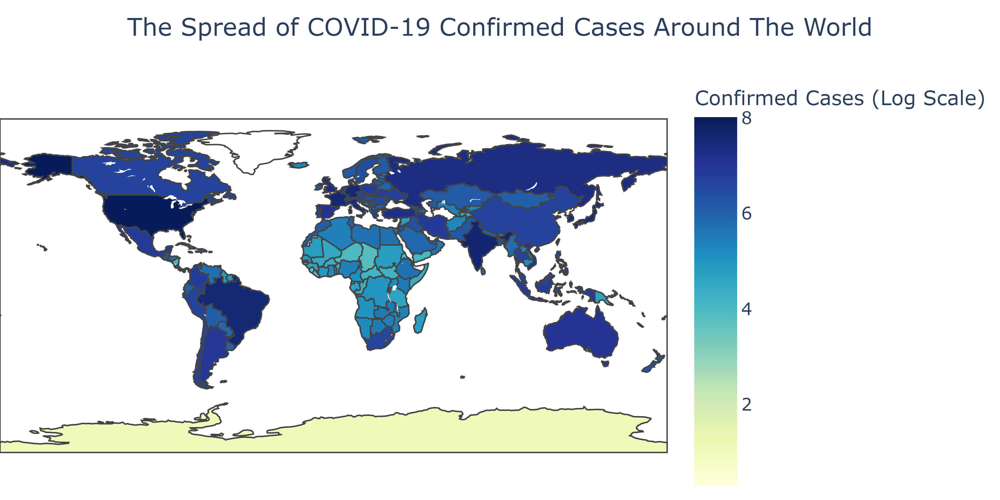

In [35]:
# Using choropleth
# Data: using country_data dataframe (log10 scale)

# list of parameters
map_value = 'Confirmed Cases'  
color = "YlGnBu"

# Create a function to plot the map
def plotting_global_heatmap(country_data, map_value, color):
    temp = country_data[['Country/Region',map_value]]
    plot = px.choropleth(temp, locations='Country/Region',   # map configuration
                        color = np.log10(temp[map_value] + 1), # + 1 to avoid divided by 0, log0
                        hover_name = 'Country/Region', # set hover name
                        hover_data = [map_value], 
                        color_continuous_scale = px.colors.sequential.Plasma, locationmode = "country names")
    plot.update_layout(title_text = "The Spread of COVID-19 {} Around The World".format(map_value), title_x=0.5,
                      height=350,margin={"r":30,"t":50,"l":0,"b":0})
    plot.update_coloraxes(colorbar_title="{} (Log Scale)".format(map_value),colorscale="YlGnBu")
    return plot

# Plotting global heat map
plot = plotting_global_heatmap(country_data,map_value,color)
#plot.show()
pio.write_image(plot, "Heat Map Confirmed Cases.png", format = 'png', scale=3)
Image(pio.to_image(plot, format='png', scale=5))

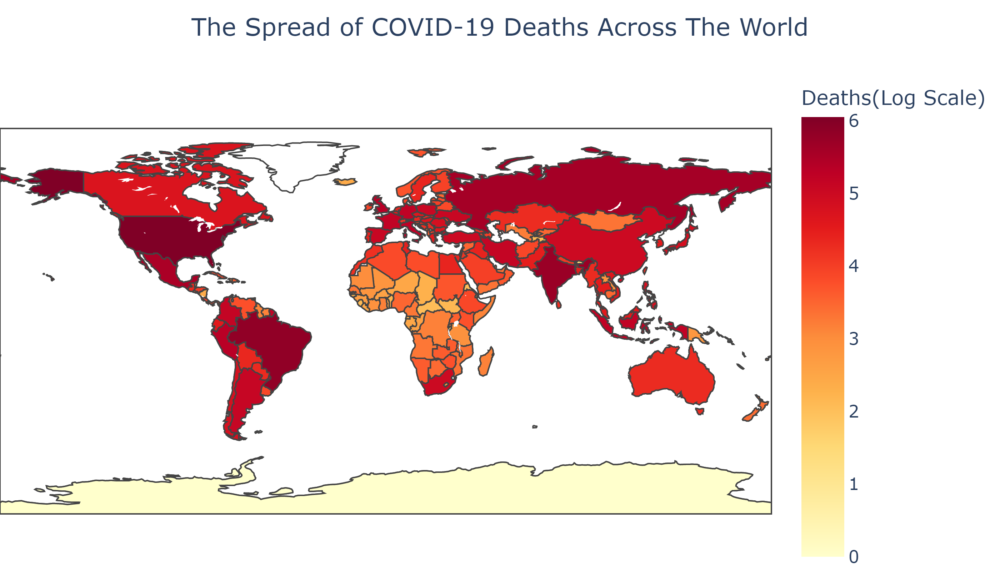

In [36]:
# Using choropleth
# Data: using country_data dataframe (log10 scale)

# list of parameters
map_value = 'Deaths'
color = "YlOrRd"

# Create a function to plot the map
def plotting_global_heatmap(country_data, map_value, color):
    temp = country_data[['Country/Region',map_value]]
    plot = px.choropleth(temp, locations='Country/Region',   # map configuration
                        color = np.log10(temp[map_value] + 1), # + 1 to avoid divided by 0, log0
                        hover_name = 'Country/Region', # set hover name
                        hover_data = [map_value], 
                        color_continuous_scale = px.colors.sequential.Greys,
                         locationmode = "country names")
    plot.update_layout(title_text = "The Spread of COVID-19 {} Across The World".format(map_value),
                       title_x=0.5, height=400,margin={"r":30,"t":50,"l":0,"b":0})
    plot.update_coloraxes(colorbar_title="{}(Log Scale)".format(map_value),
                          colorscale = "YlOrRd")
    return plot

# Plotting global heat map
plot2 = plotting_global_heatmap(country_data,map_value,color)
#plot2.show()
pio.write_image(plot2, "Heat Map Deaths.png", format = 'png', scale=5, height=400)
Image(pio.to_image(plot2, format='png', scale=4))

# 4. EXPLORE THE SPREAD OF COVID-19 IN TOP 10 COUNTRY


1. What are top 10 most-affected countries with the highest number of COVID-19 cases?
2. What are top 10 deathly countries with the highest number of COVID-19 fatalities?
3. Which worst affected countries had the highest fatality rate?
4. Which most deathly countries had the highest fatality rate ?

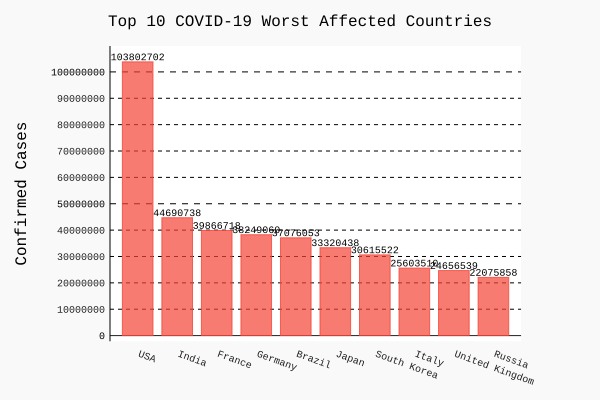

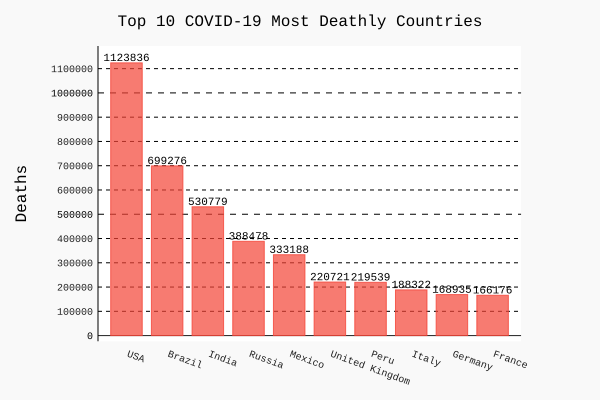

In [37]:
# TOP 10 COUNTRY BAR CHART
# Extracting top 10 countries with the highest confirmed cases
top10_country = country_data.sort_values('Confirmed Cases',ascending=False).head(10)
# Plot Top 10 Country: COVID-19 Confirmed Cases
chart_cf = pygal.Bar(show_legend = False, human_readable = True, fill = True, width = 600,
    height = 400, x_label_rotation = 20, print_values = True, print_values_position = 'top',
    style = DefaultStyle(value_font_size = 10, value_colors=('black',)))
chart_cf.y_title = "Confirmed Cases"
chart_cf.title = 'Top 10 COVID-19 Worst Affected Countries'     # set chart title
chart_cf.x_labels = [i for i in top10_country['Country/Region']]  # label of country names
chart_cf.add('Confirmed Cases', top10_country['Confirmed Cases'])            
display(SVG(chart_cf.render(disable_xml_declaration=True)))

# Extracting top 10 countries with the highest deaths
top10_country_deaths = country_data.sort_values('Deaths',ascending=False).head(10)
# plot Top 10 Country: COVID-19 Deaths
from pygal.style import DarkSolarizedStyle, NeonStyle
chart_d = pygal.Bar(show_legend = False, human_readable = True, fill = True, width = 600,
    height = 400, x_label_rotation = 20, print_values = True, print_values_position = 'top',
    style = DefaultStyle(value_font_size = 11, value_colors=('black',)))
chart_d.y_title = "Deaths"
chart_d.title = 'Top 10 COVID-19 Most Deathly Countries'     # set chart title
chart_d.x_labels = [i for i in top10_country_deaths['Country/Region']]  # label of country names
chart_d.add('Confirmed Deaths', top10_country_deaths['Deaths'])            
display(SVG(chart_d.render(disable_xml_declaration=True)))

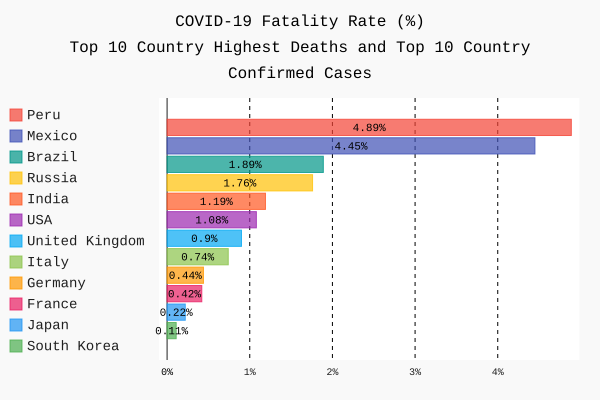

In [38]:
#### DATA PREP ###
# Calculate fatality rate for top 10 country with highest confirmed cases
top10_country['fatality_rate'] = top10_country[['Confirmed Cases','Deaths']]\
        .apply(lambda row: fatality_rate(row["Deaths"], row["Confirmed Cases"]), axis=1)

# Calculate fatality rate for top 10 country with highest deaths
top10_country_deaths['fatality_rate'] = top10_country_deaths[['Confirmed Cases','Deaths']]\
        .apply(lambda row: fatality_rate(row["Deaths"], row["Confirmed Cases"]), axis=1)

# Combine data of country with highest confirmed cases and highest deaths
df_country_top10 = pd.concat([top10_country_deaths,top10_country]).drop_duplicates().sort_values('fatality_rate',
                                                                                                ascending=False)
##### PLOT HORIZONTAL BAR CHART TO DISPLAY FATALITY RATE ####
# Plot COVID-19 Fatality Rate for Top 10 Country with Highest Confirmed Cases and Highest Deths
chart_f = pygal.HorizontalBar(print_values=True, width = 600,
    height = 400,                              # Set chart configuration
                              style = DefaultStyle(value_font_size = 11, value_colors=('black',)))
percent_formatter = lambda x: '{:.10g}%'.format(x)                             # format fatality rate in %
chart_f.value_formatter = percent_formatter   
chart_f.title = "COVID-19 Fatality Rate (%)\n Top 10 Country Highest Deaths and Top 10 Country Confirmed Cases"                   # Set chart title
for country,rate in zip(df_country_top10["Country/Region"],              # Add value to chart
                        df_country_top10["fatality_rate"]):
    chart_f.add(country,rate)
display(SVG(chart_f.render(disable_xml_declaration=True)))

### `Insights`

- The **United States** accounted for the world's **highest number of cases and deaths** at over 25.6M and 425K as of January 26th, 2020, according to CSSE data. Despite the highest number of deaths, the mortality rate in the US is only 1.67%.

- **Indian** came in **second place** with 10M infections and 153K deaths.

- In the list of the worst affected countries, **Brazil** came in third with more than 8M confirmed cases.

- **Russia, United Kingdom and France** came in as the third, fourth, and fifth place with relatively similar numbers of infections, over 3M

- **Spain, Italy, Turkey, and Germany**  came in as the last four places in top 10 most infected countries.

- In the list of the most deathly countries, Mexico came in fourth yet the fatality rate, reached 8.5%, of the countries ranked third in the world.

- In the list of the worst infected countries, Italy had the highest fatality rate of 3.48%.


# 5. TOP 10 FATALITY RATE COUNTRIES IN THE WORLD

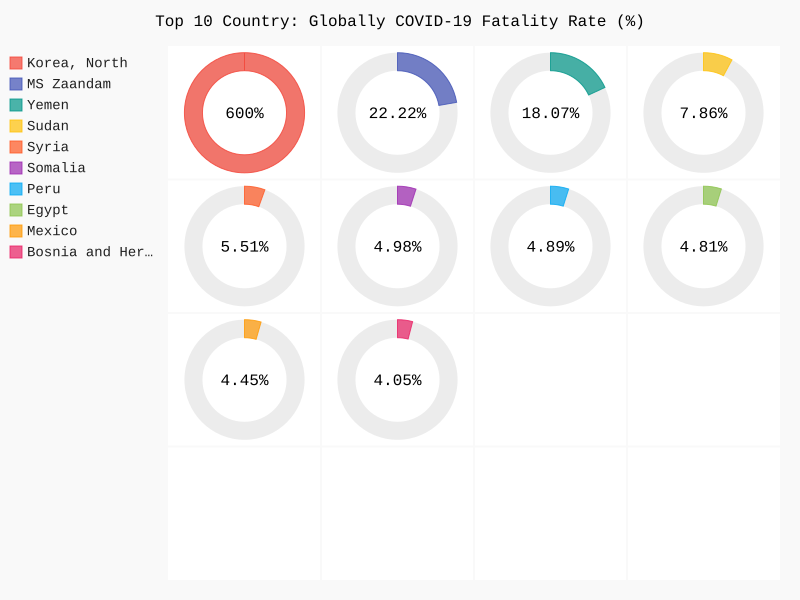

In [39]:
### Top 10 COVID-19 Fatality Rate (Globally) 
top10_country_fatality = country_data.sort_values('fatality_rate',ascending=False).head(10)
### Top 10 COVID-19 Fatality Rate (Globally) 
top10_country_fatality = country_data.sort_values('fatality_rate',ascending=False).head(10)

# Plot Fatality Rate for top highest country/region globally
gauge_fatality = pygal.SolidGauge(inner_radius=0.70)
percent_formatter = lambda x: '{:.10g}%'.format(x)
gauge_fatality.value_formatter = percent_formatter
gauge_fatality.title = "Top 10 Country: Globally COVID-19 Fatality Rate (%)"            # Set title  
for country,rate in zip(top10_country_fatality["Country/Region"],              # Add value to chart
                        top10_country_fatality["fatality_rate"]):
    gauge_fatality.add(country,[{'value':rate}])
display(SVG(gauge_fatality.render(disable_xml_declaration=True))) # Show chart

- Yemen came in as the first place with the highest fatality rate (29%). However, the country only totaled 612 deaths and 2115 cases. 

- Though MS Zaandam has the second highest fatality rate of 22% but this country has significant small confirmed cases (9) and deaths(2).  

# 6. WORLDWIDE DETAIL REPORT SINCE THE EARLY STAGE OF PANDEMIC TILL NOW

In [42]:
# Data preparation
# Sum up all the cases in the world by date
world_cases_all_time = df.groupby('Date')[['Confirmed Cases', 'Deaths']].sum().sort_values('Date', ascending=False).reset_index()
# Add new confirmed cases which indicates the difference between day of confirmed cases
# For example - 99 is the number of cases increased from 555 in 2020-1-22 to 654 in 2020-1-23
world_cases_all_time['New Cases'] = world_cases_all_time['Confirmed Cases'] - world_cases_all_time['Confirmed Cases'].shift(1)
# For good x-axis display, show only month & year
world_cases_all_time['Date'] = pd.to_datetime(world_cases_all_time['Date'])
# Sort data by date since day 1 till current time
world_cases_all_time = world_cases_all_time.sort_values("Date").reset_index(drop=True)
# Check data again
world_cases_all_time.head()


,Date,Confirmed Cases,Deaths,New Cases
0,2020-01-22,557,17,-98525839.0
1,2020-01-23,657,18,-99102455.0
2,2020-01-24,944,26,-99564150.0
3,2020-01-25,1437,42,-100045209.0
4,2020-01-26,2120,56,-100605838.0


# 7. COUNTRY COMPARISON SINCE THE EARLY STAGE OF THE PANDEMIC

In [45]:
# Sum up all cases for each country by date
countries_cases_all_time = df.groupby(['Date', 'Country/Region'])[['Confirmed Cases', 'Deaths']]\
    .sum().sort_values('Date').reset_index()

# Find top 10 countries with the highest number of confirmed cases
top10_country = country_data.sort_values('Confirmed Cases', ascending=False)\
            .head(10)['Country/Region'].unique()

print("Top 10 countries with highest confirmed cases are: \n\n{}".format(set(top10_country)))

# Extract top 10 countries cases from countries cases all time
top10_country_cases = countries_cases_all_time[countries_cases_all_time['Country/Region'].isin(top10_country)]

# Convert the date to datetime format
top10_country_cases['Date'] = pd.to_datetime(top10_country_cases['Date'])

# Calculate Log of Confirmed Cases & Deaths
top10_country_cases['Log(Confirmed Cases)'] = np.log(top10_country_cases['Confirmed Cases'])
top10_country_cases['Log(Deaths)'] = np.log(top10_country_cases['Deaths'])

top10_country_cases.head()


Top 10 countries with highest confirmed cases are: 

{'United Kingdom', 'Japan', 'Italy', 'South Korea', 'Brazil', 'Russia', 'Germany', 'France', 'India', 'USA'}


,Date,Country/Region,Confirmed Cases,Deaths,Log(Confirmed Cases),Log(Deaths)
19,2021-01-01,Russia,3153960,56798,14.964169,10.947256
57,2021-01-01,USA,20397398,352844,16.830918,12.773781
61,2021-01-01,United Kingdom,2549667,95917,14.751473,11.471239
98,2021-01-01,South Korea,62593,942,11.044409,6.848005
125,2021-01-01,Brazil,7703971,195541,15.857246,12.183525


## Top 10 Wost Affected Countries Since The Early Stage of The Pandemic

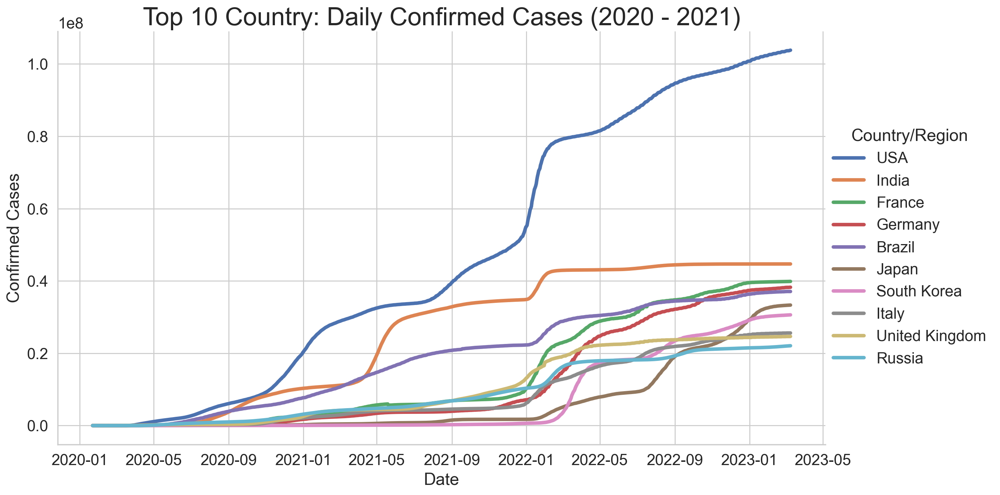

In [46]:
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5,"axes.titlesize":25})
# Plot the confirmed cases comparison between countries
sns.relplot( data = top10_country_cases, x="Date", y="Confirmed Cases", hue="Country/Region", hue_order = top10_country,
    kind="line", height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="Top 10 Country: Daily Confirmed Cases (2020 - 2021)")
plt.show();

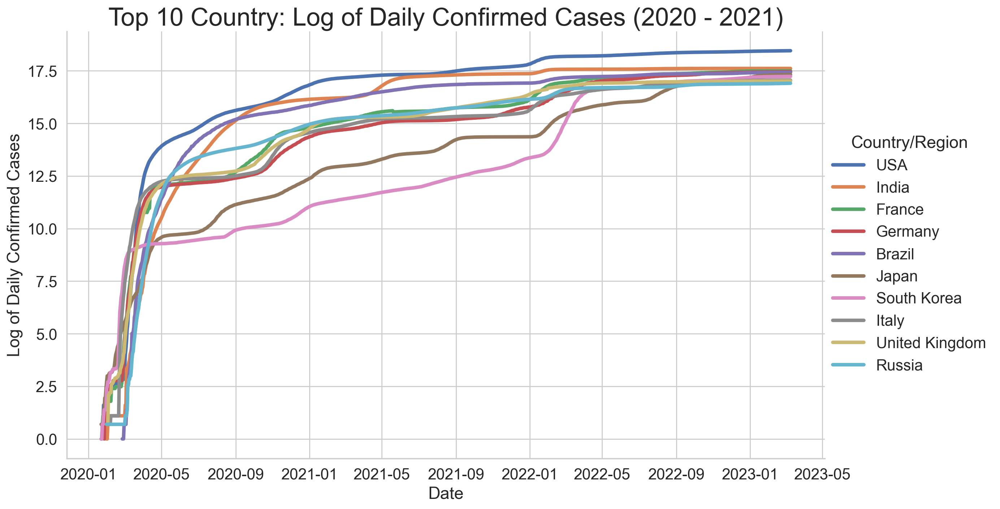

In [47]:
# Plot log confirmed cases
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5, "axes.titlesize":25})
# Plot the confirmed cases comparison between countries
sns.relplot(data = top10_country_cases, x="Date", y="Log(Confirmed Cases)", hue_order = top10_country, hue="Country/Region",
    kind="line", height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="Top 10 Country: Log of Daily Confirmed Cases (2020 - 2021)", ylabel = 'Log of Daily Confirmed Cases')
plt.show();

## Have top 10 affected countries flattened the death curves ?

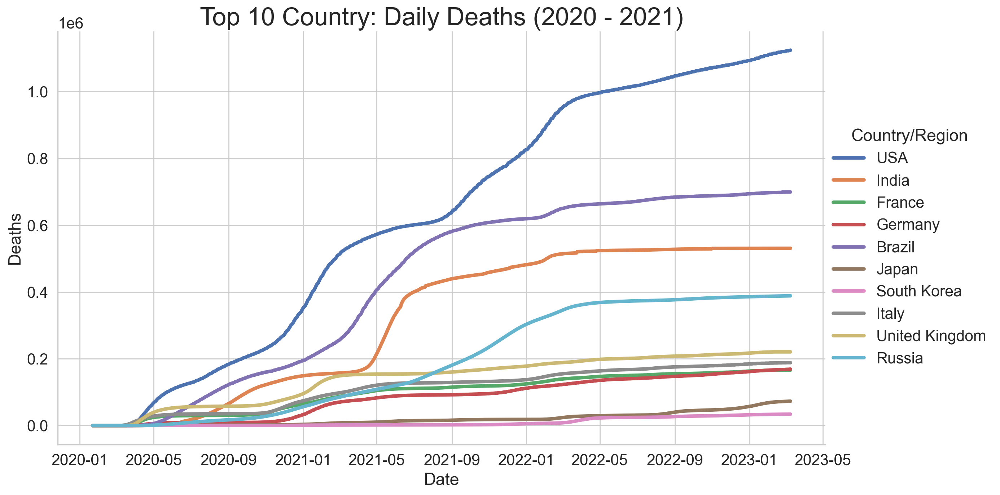

In [48]:
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5,
                                               "axes.titlesize":25})
# Plot the deaths comparison between countries
sns.relplot(
    data = top10_country_cases, x="Date", y="Deaths",
    hue="Country/Region",
    hue_order = top10_country,
    kind="line",
    height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="Top 10 Country: Daily Deaths (2020 - 2021)")
plt.show();

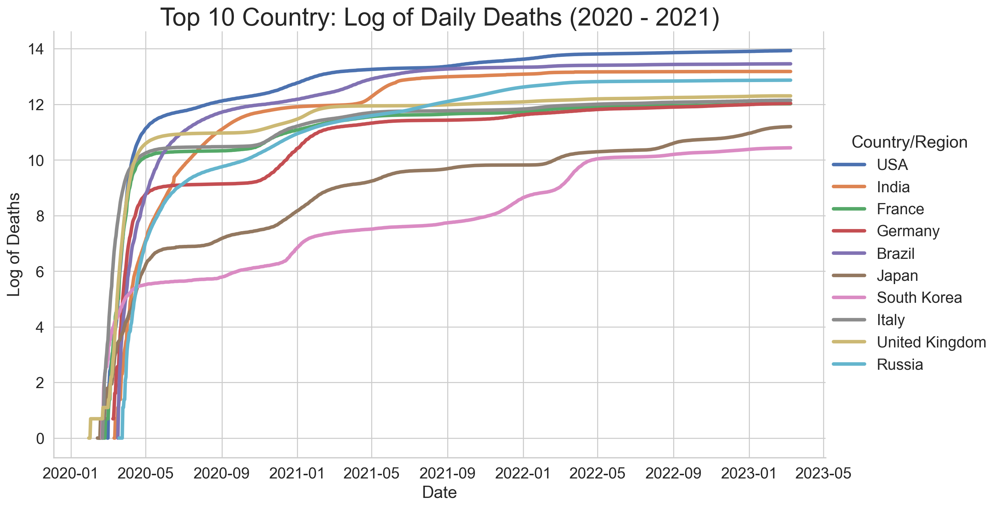

In [49]:
# Plot log deaths
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5,
                                               "axes.titlesize":25})
# Plot the log deaths comparison between countries
sns.relplot(
    data = top10_country_cases, x="Date", y="Log(Deaths)",
    hue="Country/Region",
    hue_order = top10_country,
    kind="line",
    height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="Top 10 Country: Log of Daily Deaths (2020 - 2021)",
    ylabel = 'Log of Deaths')
plt.show();

## Targeted Country Comparison Since The Early Stage of The Pandemic

In [50]:
# Set the targeted countries list
targeted_countries=['USA','China','Mexico', 'Vietnam','South Korea',
                             'Brazil','Spain','Russia','India',
                             'United Kingdom']
targeted_countries_cases = countries_cases_all_time[countries_cases_all_time['Country/Region'].isin(targeted_countries)]
targeted_countries_cases['Date'] = pd.to_datetime(targeted_countries_cases['Date'])

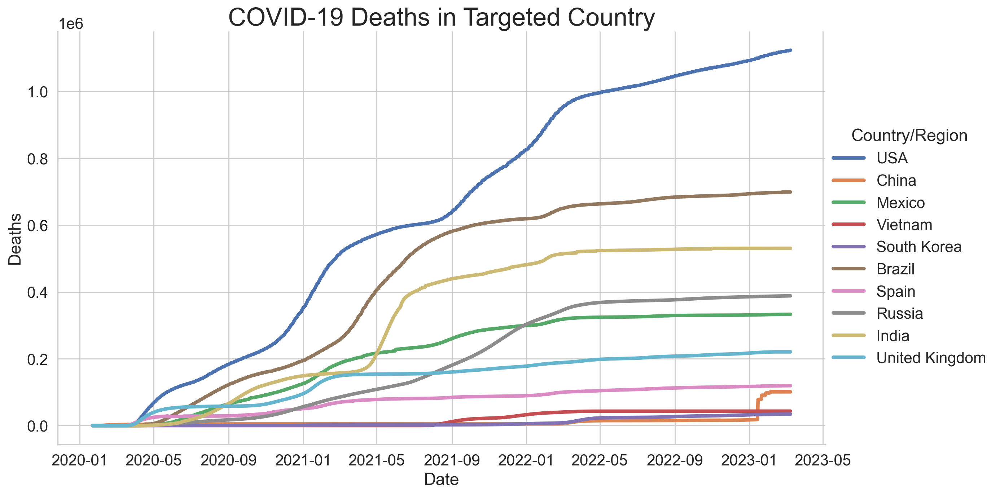

In [51]:
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5,
                                               "axes.titlesize":25})
sns.relplot(
    data = targeted_countries_cases, x="Date", y="Deaths",
    hue="Country/Region",
    hue_order = targeted_countries,
    kind="line",
    height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="COVID-19 Deaths in Targeted Country")
plt.show();

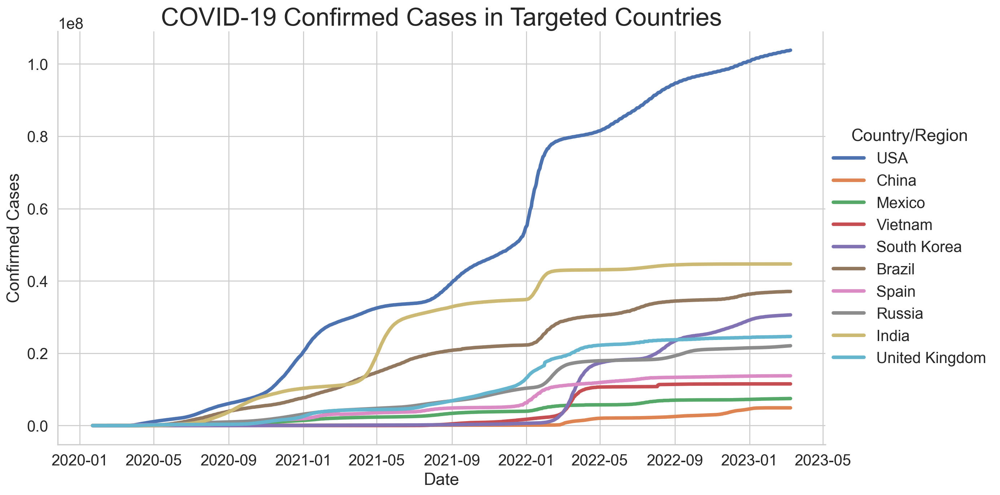

In [52]:
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":3.5,
                                               "axes.titlesize":25})
sns.relplot(
    data = targeted_countries_cases, x="Date", y="Confirmed Cases",
    hue="Country/Region",
    hue_order=targeted_countries,
    kind="line",
    height=7, aspect=1.7, facet_kws=dict(sharex=False))\
.set(title="COVID-19 Confirmed Cases in Targeted Countries")
plt.show();

## COVID-19 Confirmed Cases in Targeted Countries - Days since 100th Cases



In [53]:
# Set the targeted countries list
targeted_countries=['USA','China','Mexico', 'Vietnam','South Korea',
                             'Brazil','Spain','Russia','India',
                             'United Kingdom']

In [55]:
threshold = 100      # set threshold of 100 cases

countries_since_100cases = pd.DataFrame(columns=['Date', 'Country/Region', 'Confirmed Cases',
                                                'Deaths','Date Since 100 Cases', 'Confirmed Cases (log10)',
                                                'Deaths (log10)'])

for country_name in targeted_countries:
    # Extract targeted countries data
    country = targeted_countries_cases[targeted_countries_cases['Country/Region']==country_name]
    country = country[country['Confirmed Cases'] >= threshold]
    start_date = country['Date'].min()
    country['Date Since 100 Cases'] = (country['Date'] - start_date)/pd.Timedelta('1 days')
    country['Confirmed Cases (log10)'] = np.log10(country['Confirmed Cases'])
    country['Deaths (log10)'] = np.log10(country['Deaths'])
    countries_since_100cases = pd.concat([countries_since_100cases, country])

# Print out the result
#countries_since_100cases.head()


In [56]:
df_us_100cases = countries_since_100cases[countries_since_100cases['Country/Region']=='USA']
x_us = df_us_100cases['Date Since 100 Cases'].iloc[-1] + 8
y_us = df_us_100cases['Confirmed Cases (log10)'].iloc[-1] + 0.05
(x_us, y_us)

(1040.0, 8.05331114444717)

After 100 infections were confirmed, South Korea, Vietnam, and China quickly flattened the curve while the number of infections in US, Brazil, Russia, Spain, United Kingdom, India, and Germany had a hard time controlling the infections:

- In less than 50 days after the first 100 cases, all countries had their infections double every day and every 3 day. 
- After 100 days since the first 100 cases, the U.S., Brazil, and India seemed to have their cases double every 2 weeks.
- Vietnam is the only country had their cases double every 2 months after 300 days.

# 7. TIMELINE ANALYSIS
__________________________________________


## Data Preparation

- Extract Month, Year, and Month-Year from Date columns for data at global level, country level and USA

In [89]:
# Data at Global Level: Extract Month, Year, and Month-Year
world_cases_all_time['Day'] = pd.DatetimeIndex(world_cases_all_time['Date']).day
world_cases_all_time['Month'] = pd.DatetimeIndex(world_cases_all_time['Date']).month
world_cases_all_time['Year'] = pd.DatetimeIndex(world_cases_all_time['Date']).year
world_cases_all_time['Month-Year'] = pd.DatetimeIndex(world_cases_all_time['Date']).to_period('M')
world_cases_all_time['New Cases'] = world_cases_all_time['Confirmed Cases'] - world_cases_all_time['Confirmed Cases'].shift(1)
world_cases_all_time['New Deaths'] = world_cases_all_time['Deaths'] - world_cases_all_time['Deaths'].shift(1)
world_cases_all_time['Confirmed Cases per 100k'] = world_cases_all_time['Confirmed Cases']/100000
world_cases_all_time['Deaths per 100k'] = world_cases_all_time['Deaths']/100000
world_cases_all_time['New Cases per 100k'] = world_cases_all_time['New Cases']/100000
world_cases_all_time['New Deaths per 100k'] = world_cases_all_time['New Deaths']/100000


# Calculate Global 7 Day Rolling Average for New Cases, New Deaths, Confirmed Cases, and Deaths
# Calculate 7-day rolling average new cases globally
world_cases_all_time['7-Day Rolling Average New Cases'] = world_cases_all_time['New Cases'].rolling(7).mean()
# Calculate 7-day rolling average confirmed cases globally
world_cases_all_time['7-Day Rolling Average Confirmed Cases'] = world_cases_all_time['Confirmed Cases'].rolling(7).mean()
# Calculate 7-day rolling average new deaths globally
world_cases_all_time['7-Day Rolling Average New Deaths'] =world_cases_all_time['New Deaths'].rolling(7).mean()
# Calculate 7-day rolling average deaths globally
world_cases_all_time['7-Day Rolling Average Deaths'] = world_cases_all_time['Deaths'].rolling(7).mean()
# Calculate 7-day rolling average new cases globally per 100k
world_cases_all_time['7-Day Rolling Average New Cases per 100k'] = world_cases_all_time['New Cases per 100k'].rolling(7).mean()
# Calculate 7-day rolling average confirmed cases globally per 100k
world_cases_all_time['7-Day Rolling Average Confirmed Cases per 100k'] = world_cases_all_time['Confirmed Cases per 100k'].rolling(7).mean()
# Calculate 7-day rolling average new deaths globally per 100k
world_cases_all_time['7-Day Rolling Average New Deaths per 100k'] =world_cases_all_time['New Deaths per 100k'].rolling(7).mean()
# Calculate 7-day rolling average deaths globally per 100k
world_cases_all_time['7-Day Rolling Average Deaths per 100k'] = world_cases_all_time['Deaths per 100k'].rolling(7).mean()
# Check the data
#vn_df.tail()

# Data at Country Level: Extract Month, Year, and Month-Year
countries_cases_all_time['Date'] = pd.to_datetime(countries_cases_all_time['Date'])
countries_cases_all_time['Month'] = pd.DatetimeIndex(countries_cases_all_time['Date']).month
countries_cases_all_time['Year'] = pd.DatetimeIndex(countries_cases_all_time['Date']).year
countries_cases_all_time['Day'] = pd.DatetimeIndex(countries_cases_all_time['Date']).day
countries_cases_all_time['Month-Year'] = pd.DatetimeIndex(countries_cases_all_time['Date']).to_period('M')


# Extract US data
countries_cases_all_time = countries_cases_all_time.sort_values(["Country/Region","Date"]).reset_index(drop=True)
us_df=countries_cases_all_time[countries_cases_all_time["Country/Region"]=="India"]
# Calculate US new cases
us_df["New Cases"] = us_df["Confirmed Cases"] - us_df["Confirmed Cases"].shift(1)
us_df["New Deaths"] = us_df["Deaths"] - us_df["Deaths"].shift(1)
# Calculate 7-day rolling average new cases in US
us_df['7-Day Rolling Average New Cases'] = us_df['New Cases'].rolling(7).mean()
# Calculate 7-day rolling average confirmed cases in US
us_df['7-Day Rolling Average Confirmed Cases'] = us_df['Confirmed Cases'].rolling(7).mean()
# Calculate 7-day rolling average new cases in US
us_df['7-Day Rolling Average New Deaths'] = us_df['New Deaths'].rolling(7).mean()
# Calculate 7-day rolling average deaths in US
us_df['7-Day Rolling Average Deaths'] = us_df['Deaths'].rolling(7).mean()


# Calculate per 100k
us_df['New Cases per 100k'] = us_df['New Cases']/100000
us_df['New Deaths per 100k'] = us_df['New Deaths']/100000

# Engineer the rest of the the world data
us_df = us_df.reset_index() # Reset US index
world_cases_all_time['Rest of World Confirmed Cases'] = world_cases_all_time['Confirmed Cases'] - us_df['Confirmed Cases']
world_cases_all_time['Rest of World Deaths'] = world_cases_all_time['Deaths'] - us_df['Deaths']
world_cases_all_time['Rest of World New Cases'] = world_cases_all_time['Rest of World Confirmed Cases'] - world_cases_all_time['Rest of World Confirmed Cases'].shift(1)
world_cases_all_time['Rest of World New Deaths'] = world_cases_all_time['Rest of World Deaths'] - world_cases_all_time['Rest of World Deaths'].shift(1)
world_cases_all_time['Rest of World 7-Day Rolling Average New Cases'] = world_cases_all_time['Rest of World New Cases'].rolling(7).mean()
world_cases_all_time['Rest of World 7-Day Rolling Average New Deaths'] = world_cases_all_time['Rest of World New Deaths'].rolling(7).mean()

# Rest of the world per 100k
world_cases_all_time['Rest of World New Cases per 100k'] = world_cases_all_time['Rest of World New Cases']/100000
world_cases_all_time['Rest of World New Deaths per 100k'] = world_cases_all_time['Rest of World New Deaths']/100000

# Extract VN data
vn_df=countries_cases_all_time[countries_cases_all_time["Country/Region"]=="USA"]
# Calculate VN new cases
vn_df["New Cases"] = vn_df["Confirmed Cases"] - vn_df["Confirmed Cases"].shift(1)
vn_df["New Deaths"] = vn_df["Deaths"] - vn_df["Deaths"].shift(1)
# Calculate 7-day rolling average new cases in Vietnam
vn_df['7-Day Rolling Average New Cases'] = vn_df['New Cases'].rolling(7).mean()
# Calculate 7-day rolling average confirmed cases in Vietnam
vn_df['7-Day Rolling Average Confirmed Cases'] = vn_df['Confirmed Cases'].rolling(7).mean()
# Calculate 7-day rolling average new deaths in Vietnam
vn_df['7-Day Rolling Average New Deaths'] = vn_df['New Deaths'].rolling(7).mean()
# Calculate 7-day rolling average deaths in Vietnam
vn_df['7-Day Rolling Average Deaths'] = vn_df['Deaths'].rolling(7).mean()
# Check the data

# Define a function to add season 
def season(month):
    if month in ([2,3,4]):
        season = "Spring"
    elif month in ([5,6,7]):
        season = "Summer"
    elif month in ([8,9,10]):
        season = "Fall"
    else:
        season = "Winter"
    return season

# Apply to add more season to vn and us
vn_df['season'] = vn_df["Month"].apply(lambda x:season(x)) # Add season to VN
us_df['season'] = us_df["Month"].apply(lambda x:season(x)) # Add season to US

In [90]:
world_cases_all_time.head()

,Date,Confirmed Cases,Deaths,New Cases,Day,Month,Year,Month-Year,New Deaths,Confirmed Cases per 100k,...,7-Day Rolling Average New Deaths per 100k,7-Day Rolling Average Deaths per 100k,Rest of World Confirmed Cases,Rest of World Deaths,Rest of World New Cases,Rest of World New Deaths,Rest of World 7-Day Rolling Average New Cases,Rest of World 7-Day Rolling Average New Deaths,Rest of World New Cases per 100k,Rest of World New Deaths per 100k
0,2020-01-22,557,17,NaN,22,1,2020,2020-01,NaN,0.00557,...,NaN,NaN,557,17,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-01-23,657,18,100.0,23,1,2020,2020-01,1.0,0.00657,...,NaN,NaN,657,18,100.0,1.0,NaN,NaN,0.00100,0.00001
2,2020-01-24,944,26,287.0,24,1,2020,2020-01,8.0,0.00944,...,NaN,NaN,944,26,287.0,8.0,NaN,NaN,0.00287,0.00008
3,2020-01-25,1437,42,493.0,25,1,2020,2020-01,16.0,0.01437,...,NaN,NaN,1437,42,493.0,16.0,NaN,NaN,0.00493,0.00016
4,2020-01-26,2120,56,683.0,26,1,2020,2020-01,14.0,0.02120,...,NaN,NaN,2120,56,683.0,14.0,NaN,NaN,0.00683,0.00014


In [91]:
#countries_cases_all_time.head()

In [92]:
us_df.head()

,index,Date,Country/Region,Confirmed Cases,Deaths,Month,Year,Day,Month-Year,New Cases,New Deaths,7-Day Rolling Average New Cases,7-Day Rolling Average Confirmed Cases,7-Day Rolling Average New Deaths,7-Day Rolling Average Deaths,New Cases per 100k,New Deaths per 100k,season
0,90297,2020-01-22,India,0,0,1,2020,22,2020-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Winter
1,90298,2020-01-23,India,0,0,1,2020,23,2020-01,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,Winter
2,90299,2020-01-24,India,0,0,1,2020,24,2020-01,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,Winter
3,90300,2020-01-25,India,0,0,1,2020,25,2020-01,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,Winter
4,90301,2020-01-26,India,0,0,1,2020,26,2020-01,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,Winter


In [93]:
#vn_df.head()

## COVID-19 AT Global Level 

I will visualize the following features on a monthly basis and on a daily basis:

- 7-Day Rolling Average Confirmed Cases vs. Confirmed Cases
- 7-Day Rolling Average Deaths vs. Deaths
- 7-Day Rolling Average New Cases vs New Deaths
- 7-Day Rolling average New Deaths vs New Deaths

## 1. Monthly Confirmed Cases & Deaths 7-Day Rolling Average

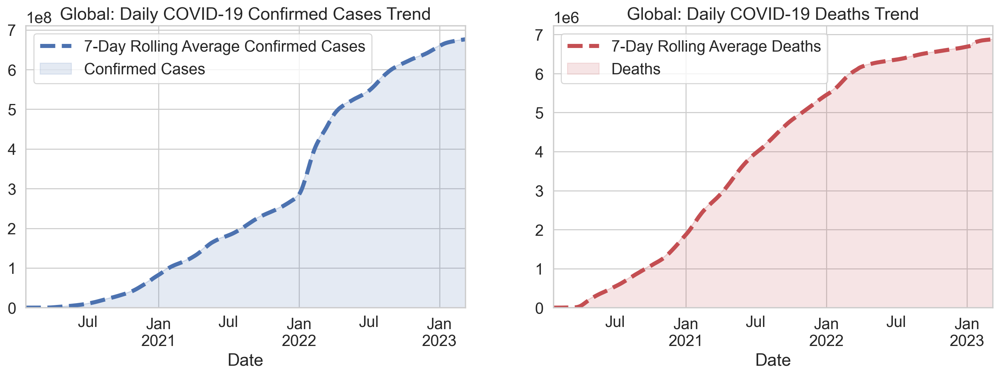

In [94]:
# Set up matplotlib figure
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":1, "axes.titlesize":17})
# Set the format of the chart
f, ax = plt.subplots(figsize=(17,5), ncols=2,
                     sharex=False)
# Plot global monthly new cases trend
world_cases_all_time.groupby('Date')["7-Day Rolling Average Confirmed Cases"].sum().plot(ax=ax[0], kind="line",
        title = "Global: Daily COVID-19 Confirmed Cases Trend",linestyle="dashed", linewidth=4, legend=True)
world_cases_all_time.groupby('Date')["Confirmed Cases"].sum().plot(ax=ax[0], kind="area", color = "b", alpha = .15,
        title = "Global: Daily COVID-19 Confirmed Cases Trend", legend=True)

# Plot monthly new deaths trend
world_cases_all_time.groupby('Date')["7-Day Rolling Average Deaths"].sum().plot(ax=ax[1], kind="line",
        color='r', title="Global: Daily COVID-19 Deaths Trend", linestyle="dashed", linewidth=4, legend=True);
world_cases_all_time.groupby('Date')["Deaths"].sum().plot(ax=ax[1], kind="area", alpha=.15,
        color='r', title="Global: Daily COVID-19 Deaths Trend", legend=True)

plt.show();

## 2. Daily Confirmed Cases & Deaths 7-Day Rolling Average

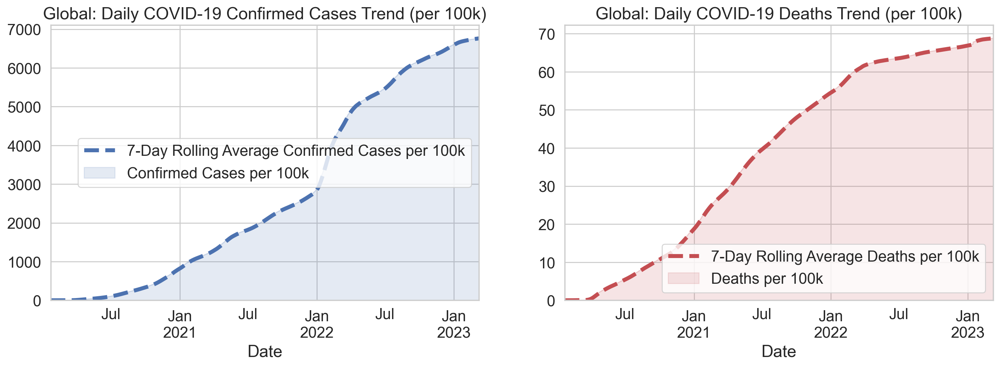

In [95]:
# Set up matplotlib figure
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":1, "axes.titlesize":17})
# Set the format of the chart
f, ax = plt.subplots(figsize=(17,5), ncols=2,
                     sharex=False)
# Plot global monthly new cases trend
world_cases_all_time.groupby('Date')["7-Day Rolling Average Confirmed Cases per 100k"].sum().plot(ax=ax[0], kind="line",
        title = "Global: Daily COVID-19 Confirmed Cases Trend",linestyle="dashed", linewidth=4, legend=True)
world_cases_all_time.groupby('Date')["Confirmed Cases per 100k"].sum().plot(ax=ax[0], kind="area", color = "b", alpha = .15,
        title = "Global: Daily COVID-19 Confirmed Cases Trend (per 100k)", legend=True)

# Plot monthly new deaths trend
world_cases_all_time.groupby('Date')["7-Day Rolling Average Deaths per 100k"].sum().plot(ax=ax[1], kind="line",
        color='r', title="Global: Daily COVID-19 Deaths Trend", linestyle="dashed", linewidth=4, legend=True);
world_cases_all_time.groupby('Date')["Deaths per 100k"].sum().plot(ax=ax[1], kind="area", alpha=.15,
        color='r', title="Global: Daily COVID-19 Deaths Trend (per 100k)", legend=True)

plt.show();

## 3. Daily Confirmed New Cases & Deaths 7-Day Rolling Average

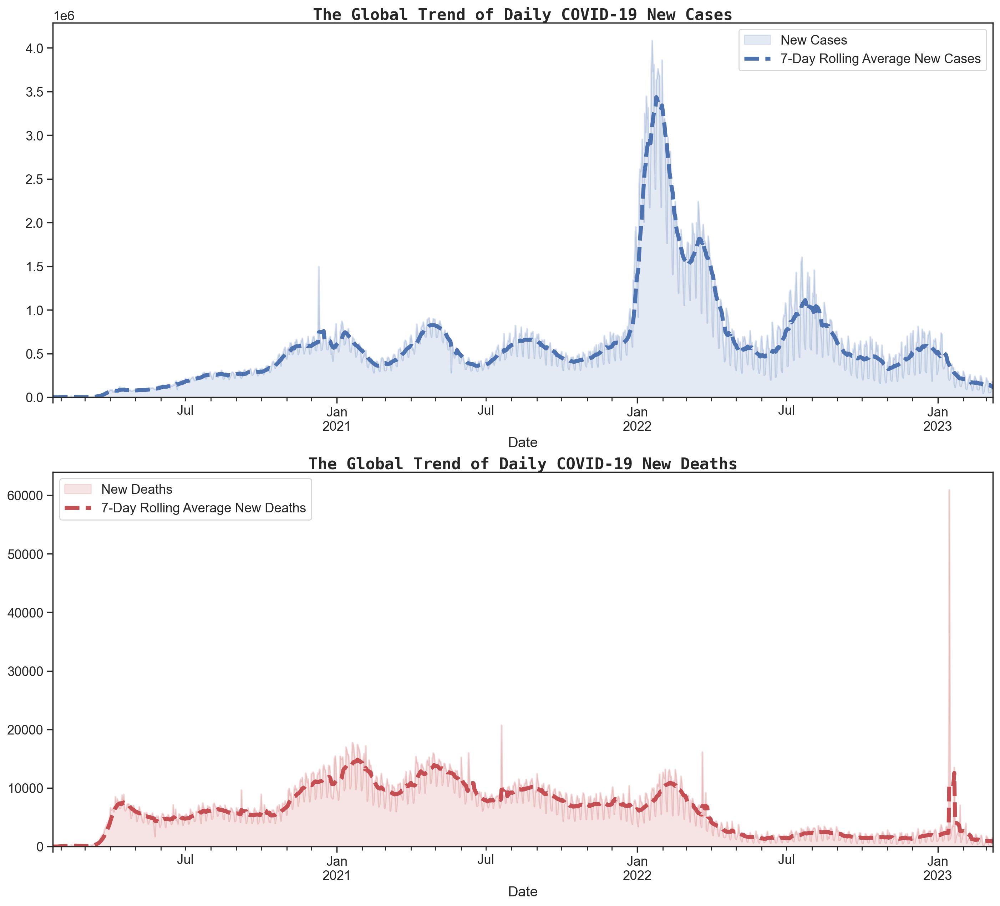

In [96]:
# Set up matplotlib figure
sns.set(style="ticks")
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth":2, "axes.titlesize":20})
# Set the format of the chart
f, ax = plt.subplots(figsize=(17,15), nrows=2,
                     sharex=False)
# Plot global monthly new cases trend
world_cases_all_time.groupby('Date')["New Cases"].sum().plot(ax=ax[0], kind="area",legend=True,color="b", alpha=.15)
world_cases_all_time.groupby('Date')["7-Day Rolling Average New Cases"].sum().plot(ax=ax[0], kind="line",
                                                        legend=True, color="b", linestyle="dashed",linewidth=4)

# Plot monthly new deaths trend
world_cases_all_time.groupby('Date')["New Deaths"].sum().plot(ax=ax[1], kind="area", legend=True, color="r",alpha=.15,
        title="Global: Daily New COVID-19 Deaths Trend")
world_cases_all_time.groupby('Date')["7-Day Rolling Average New Deaths"].sum().plot(ax=ax[1], kind="line", legend=True,
        color='r', title="Global: Daily New COVID-19 Deaths Trend", linestyle="dashed", linewidth=4);

ax[0].set_title("The Global Trend of Daily COVID-19 New Cases", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)

ax[1].set_title("The Global Trend of Daily COVID-19 New Deaths", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)


plt.savefig('Global COVID-19 Trend.png',dpi=200,bbox_inches='tight')

## 4. Global New Cases & Deaths Distribution On a Daily Basis

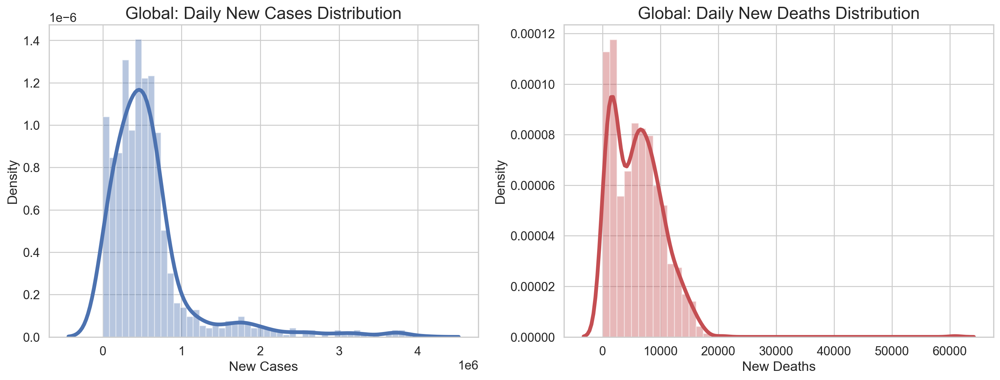

In [97]:
# KDE (Kernal Density Estimate) Plot: Visualize the distribution of observations in the dataset
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth":4,
                                               "axes.titlesize":18})
f, ax = plt.subplots(figsize=(18,6), ncols=2)

# Plot KDE new cases
sns.distplot(world_cases_all_time["New Cases"].iloc[1:], kde=True, label = "New Cases", ax=ax[0])
ax[0].set_title("Global: Daily New Cases Distribution")

# Plot KDE new deaths
sns.distplot(world_cases_all_time["New Deaths"].iloc[1:], kde=True, ax=ax[1], color="r")
ax[1].set_title("Global: Daily New Deaths Distribution")

plt.show();

## 5. Global New Cases & Deaths (Per 100K) Distribution On a Daily Basis

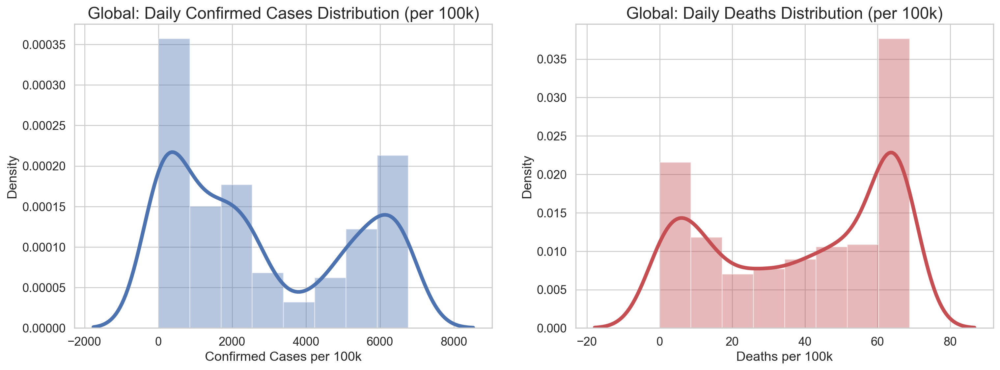

In [98]:
# KDE (Kernal Density Estimate) Plot: Visualize the distribution of observations in the dataset
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth":4,
                                               "axes.titlesize":18})
f, ax = plt.subplots(figsize=(18,6), ncols=2)

# Plot KDE new cases
sns.distplot(world_cases_all_time["Confirmed Cases per 100k"].iloc[1:], kde=True, label = "New Cases", ax=ax[0])
ax[0].set_title("Global: Daily Confirmed Cases Distribution (per 100k)")

# Plot KDE new deaths
sns.distplot(world_cases_all_time["Deaths per 100k"].iloc[1:], kde=True, ax=ax[1], color="r")
ax[1].set_title("Global: Daily Deaths Distribution (per 100k)")

plt.show();

For every 100,000 population, the number of infections confirmed reached 0 to 1000 in the world every day and the nubmer of deaths can range from 0 to 20.

## India Timeline Analysis

### How does the situation look like in the United States ?
 
  - 1. KDE (Kernal Density Estimate): Daily New Cases & Deaths Distribution.
  - 2. Bar Chart: Monthly Total New Cases and New Deaths in U.S.
  - 3. Boxplot: Monthly New Cases & Deaths Distribution
  - 4. Line & Area Chart: 7 Days Rolling Average of Confirmed Cases, Deaths, New Cases, New Deaths Over Time.
  - 5. Heatmap: New Cases & New Deaths for days of the month.
________________________________

In [100]:
# Country_data
print("Up till {}".format(final_date))
print("United States has {} confirmed cases, {} deaths, and {}% fatality rate".\
      format(country_data[country_data['Country/Region']=='India']['Confirmed Cases'].iloc[0],
            country_data[country_data['Country/Region']=='India']['Deaths'].iloc[0],
            country_data[country_data['Country/Region']=='India']['fatality_rate'].iloc[0]))

Up till 03/09/2023
United States has 44690738 confirmed cases, 530779 deaths, and 1.19% fatality rate


## 1. KDE (Kernal Density Estimate): Daily New Cases & Deaths Distribution.

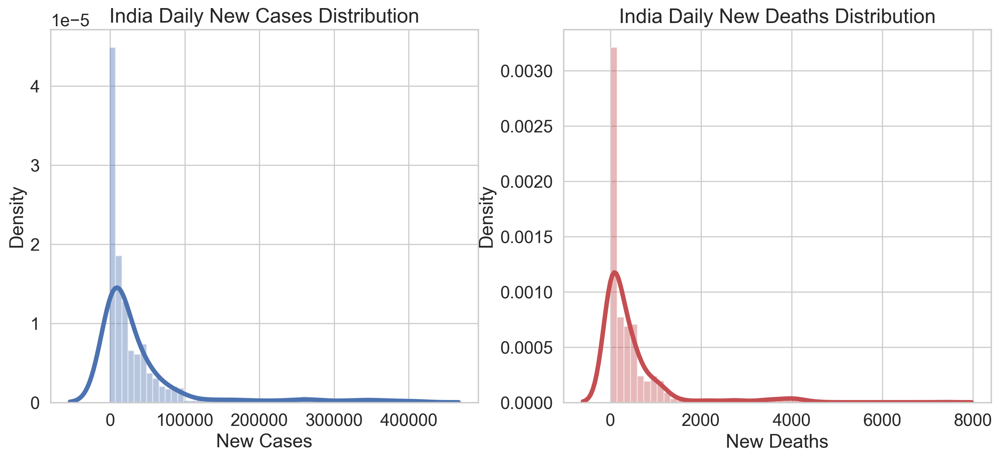

In [102]:
# KDE (Kernal Density Estimate) Plot: Visualize the distribution of observations in the dataset
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4,
                                               "axes.titlesize":18})
f, ax = plt.subplots(figsize=(15,6), ncols=2)

# Plot KDE  new cases
sns.distplot(us_df["New Cases"].iloc[1:], kde=True, ax=ax[0])
ax[0].set_title("India Daily New Cases Distribution")

# Plot KDE  new deaths
sns.distplot(us_df["New Deaths"].iloc[1:], kde=True, ax=ax[1], color="r")
ax[1].set_title("India Daily New Deaths Distribution")

plt.show();

## 2. Bar Chart: Monthly Total New Cases and New Deaths in India

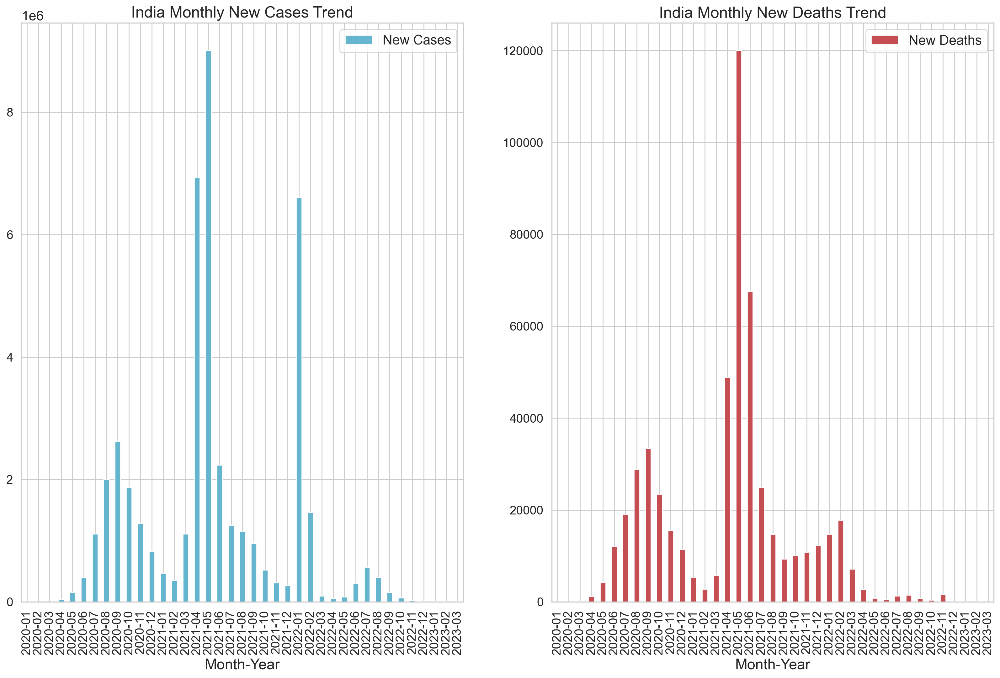

In [104]:
# BAR CHART: Plot total new cases in US 
# Set up matplotlib figure
f, ax = plt.subplots(figsize=(20,12), ncols=2, sharex=False)

# Set figure style
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4, "axes.titlesize":18})


# Plot US Monthly New Cases Trend
us_df.groupby("Month-Year")['New Cases'].sum().plot(kind="bar",
    title="India Monthly New Cases Trend", color="c", legend="True", fontsize=14, ax=ax[0])

# Plot US Monthly New Deaths Trend
us_df.groupby("Month-Year")['New Deaths'].sum().plot(kind="bar",
    title="India Monthly New Deaths Trend", color="r", legend="True", fontsize=14, ax=ax[1])
plt.show()

## 3. Boxplot: Monthly New Cases & Deaths Distribution

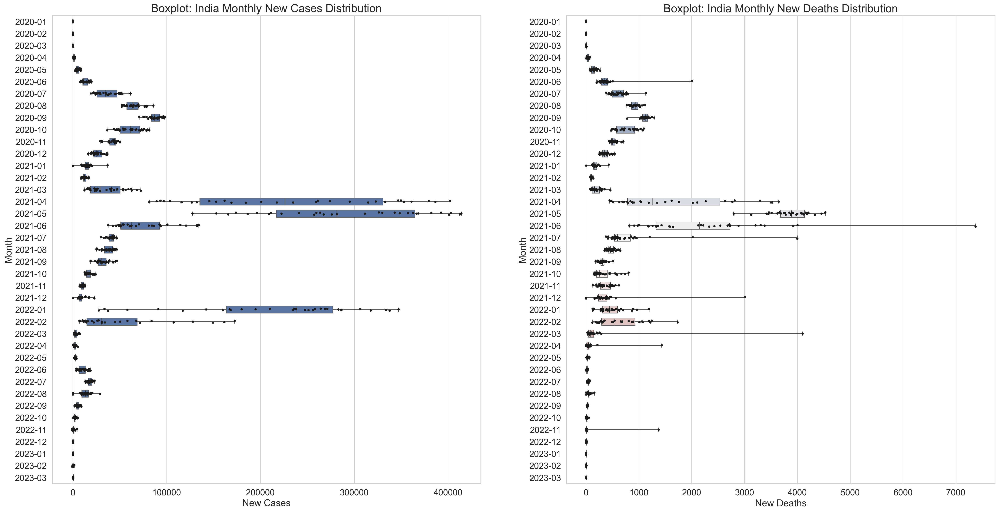

In [105]:
# Set up the plot view (BOXPLOTS)
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":2, "axes.titlesize":20})
f,ax = plt.subplots(figsize=(30,15),ncols=2)

# Plot new cases distribution by month in US
# Plot the orbital period with horizontal boxes
sns.boxplot(x="New Cases", y="Month-Year", data=us_df, whis=[0,100], width=.6,ax=ax[0])

# Add in points to show each obersvation
sns.stripplot(x="New Cases", y="Month-Year", data=us_df, size=4, color=".1", linewidth=0,ax=ax[0])

# Tweak the visual presentation
ax[0].xaxis.grid(True)
ax[0].set(ylabel="Month", title="Boxplot: India Monthly New Cases Distribution")

#Plot new deaths distribution by month in US
# Plot the orbital period with horizontal boxes
sns.boxplot(x="New Deaths", y="Month-Year", data=us_df, whis=[0,100], width=.6,ax=ax[1], palette="vlag")

# Add in points to show each obersvation
sns.stripplot(x="New Deaths", y="Month-Year", data=us_df, size=4, color=".1", linewidth=0, ax=ax[1])

# TEak the visual presentation
ax[1].xaxis.grid(True)
ax[1].set(ylabel="Month", title="Boxplot: India Monthly New Deaths Distribution")

plt.show();

## 5. Heatmap: New Cases & New Deaths Every Day of The Month.


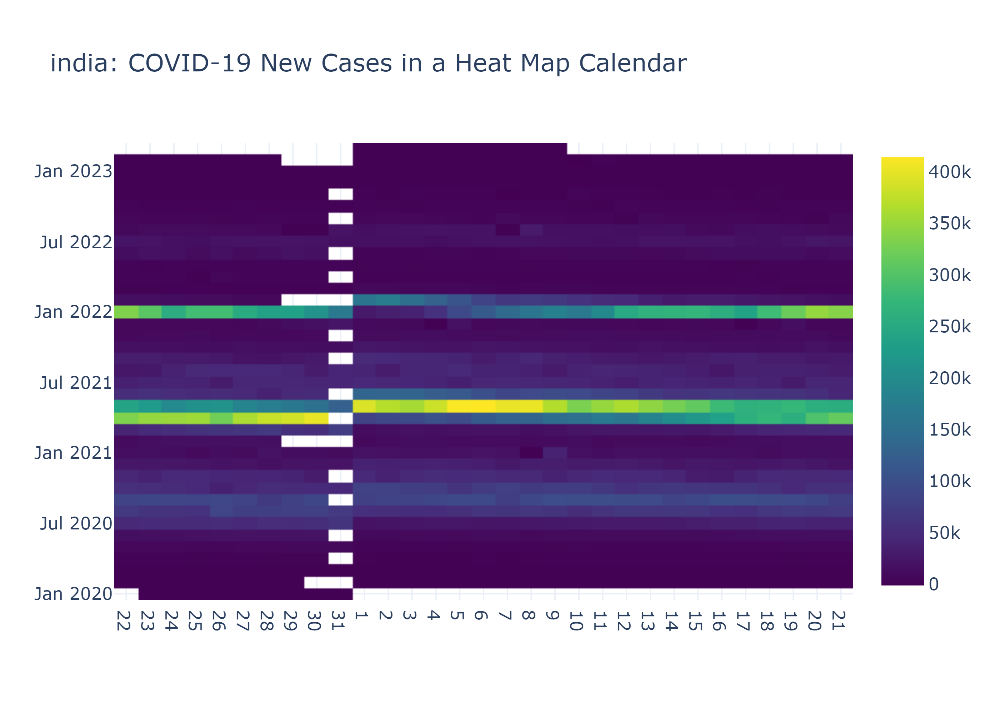

In [109]:
us_df['Month-Year'] = us_df['Month-Year'].apply(str)
us_df['Day'] = us_df['Day'].apply(str)
# Heatmap - demonstrate the number of new cases
fig7 = go.Figure(data=go.Heatmap( z=us_df['New Cases'], x=us_df['Day'], y=us_df['Month-Year'],
        colorscale='Viridis'))
fig7.update_layout(title = 'india: COVID-19 New Cases in a Heat Map Calendar')
pio.write_image(fig7, "india New Cases Calendar Heatmap.png", format='png',scale=4)
#fig5.show()
Image(pio.to_image(fig7, format='png', scale=4))

December 2020 and January 2021 saw a significant increase in infections, from 200,000 to 300,000 new cases every day in the Untied States.

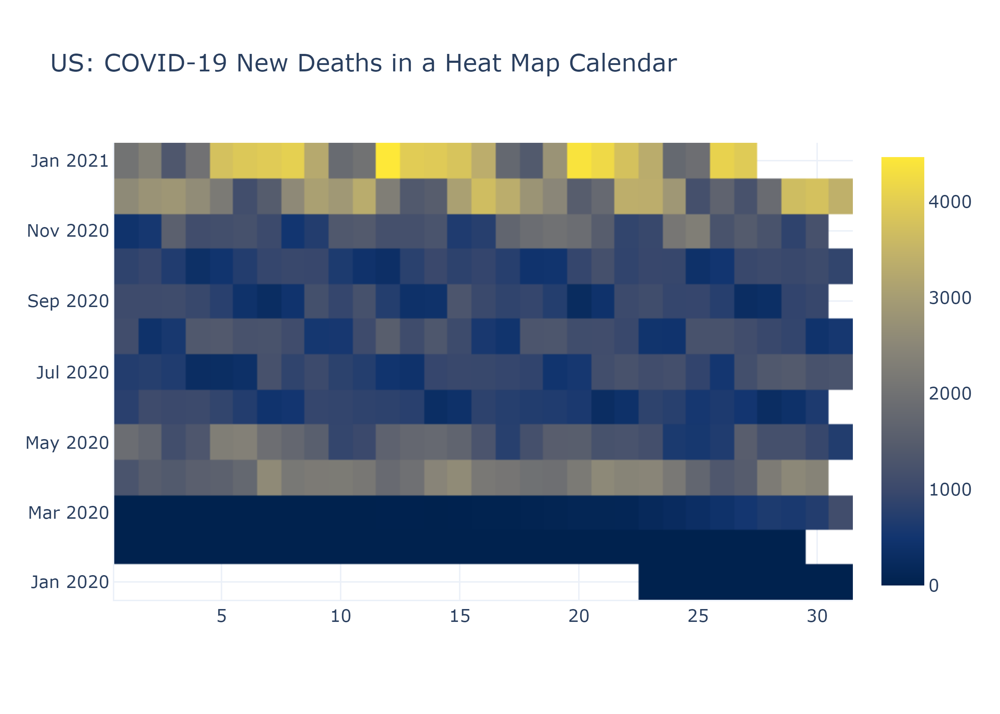

In [279]:
# Heatmap - demonstrate the number of new deaths
us_df['Month-Year'] = us_df['Month-Year'].apply(str)
us_df['Day'] = us_df['Day'].apply(str)
fig8 = go.Figure(data=go.Heatmap( z=us_df['New Deaths'], x=us_df['Day'], y=us_df['Month-Year'],
        colorscale='Cividis'))
fig8.update_layout(title = 'US: COVID-19 New Deaths in a Heat Map Calendar')
pio.write_image(fig8, "US New Deaths Calendar Heatmap.png", format='png',scale=4)
#fig6.show()

Image(pio.to_image(fig8, format='png', scale=4))

The number of new deaths reached 4,000 every days in the U.S. in January 2021.

# COVID-19 SITUATION: U.S. VERSUS THE REST OF THE WORLD


Understand the difference of situation between U.S. and The Rest of The World by looking at:

   - The increase in cases and deaths on a Monthly basis.
   - The increase in cases and deaths on a Daily basis.
 
From November 2020 to 2021, the daily new infections in the U.S. were almost half the total new infections all over the world.


From May to November 2020, US had a low and constant number of deaths but the number significantly spiked up in December 2020 and January 2021. The total deaths in the U.S. was approximately one-fourth the total deaths of the rest of the world. 
   

There was a spike in new cases of the rest of the world around the end of December 2020 and the start of January 2021 while the number of new cases in the U.S. was quite stable during that time.

## 1. How does the increase in monthly infections of the US compared to of the rest of the world?

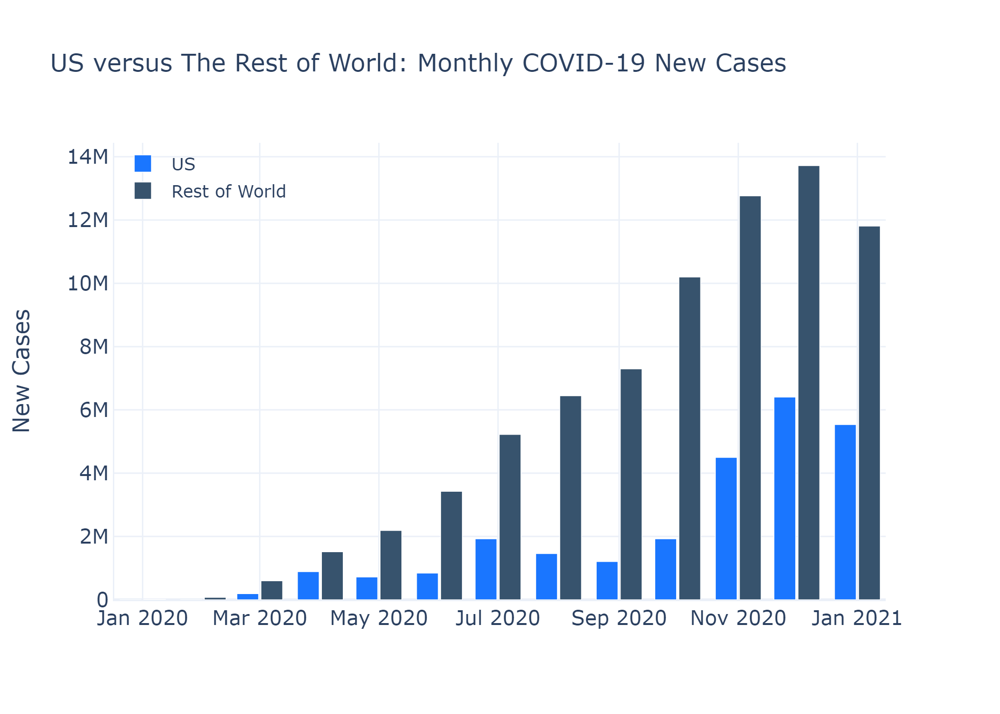

In [175]:
fig9 = go.Figure()
fig9.add_trace(go.Bar(x=[str(i) for i in us_df.groupby('Month-Year')['New Cases'].sum().index],    # Add month
                      y=us_df.groupby('Month-Year')['New Cases'].sum().values,
                      name="US",
                      marker_color='rgb(26, 118, 255)'))  # Add total monthly new cases 
fig9.add_trace(go.Bar(x=[str(i) for i in world_cases_all_time.groupby('Month-Year')['Rest of World New Cases'].sum().index],
                      y=world_cases_all_time.groupby('Month-Year')['Rest of World New Cases'].sum().values,
                      name="Rest of World",
                      marker_color='rgb(55, 83, 109)'))
fig9.update_layout(title='US versus The Rest of World: Monthly COVID-19 New Cases',
                  xaxis_tickfont_size=14,
                  yaxis=dict(title='New Cases',
                            titlefont_size=16,
                            tickfont_size=14),
                  legend=dict(x=0, y=1.0,
                             bgcolor='rgba(255, 255, 255, 0)',
                             bordercolor='rgba(255, 255, 255, 0)'),
                  barmode='group', 
                  bargap =0.15,
                 bargroupgap=0.1)
#fig9.show()     # interactive chart
pio.write_image(fig9, "US and The Rest New Cases.png", format='png',scale=4)
Image(pio.to_image(fig9, format='png', scale=3))
#pio.write_image(fig9, "US and The Rest New Cases.png", format='png',scale=4)

## 2. How does the increase in daily infections of the US compared to of the rest of the world?

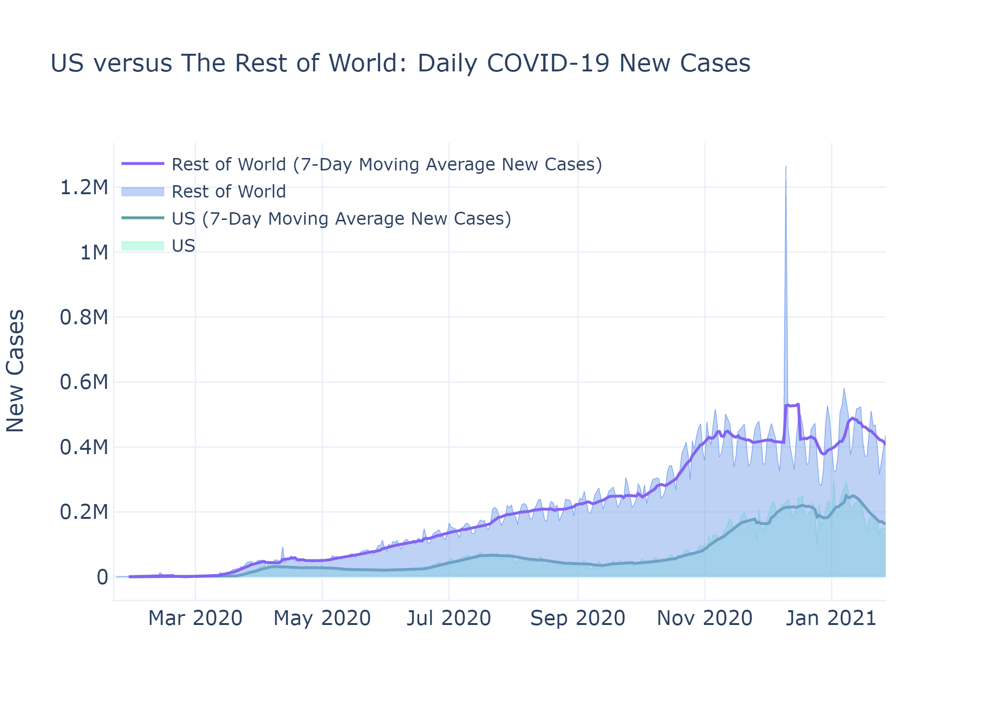

In [176]:
# AREA PLOT: US vs THE WORLD : DAILY COVID-19 NEW DEATHS
line_us = go.Figure() 

line_us.add_trace(go.Scatter(x=us_df["Date"], y=us_df["New Cases"],
                              fill='tonexty', name="US", line=dict(width=0.5, color='rgb(150, 247, 210)')))

line_us.add_trace(go.Scatter(x=us_df["Date"], y=us_df["7-Day Rolling Average New Cases"],
                             line= dict(color='cadetblue', width=2),
                             name="US (7-Day Moving Average New Cases)"))

line_us.add_trace(go.Scatter(x = world_cases_all_time["Date"], y=world_cases_all_time["Rest of World New Cases"],
                              name="Rest of World", fill='tozeroy',line=dict(width=0.5, color='rgb(127, 166, 238)')))


line_us.add_trace(go.Scatter(x= world_cases_all_time["Date"], y= world_cases_all_time["Rest of World 7-Day Rolling Average New Cases"],
                             line= dict(color='rgb(131, 100, 241)', width=2),
                             name="Rest of World (7-Day Moving Average New Cases)"))

line_us.update_layout(title='US versus The Rest of World: Daily COVID-19 New Cases',
                  xaxis_tickfont_size=14,
                  yaxis=dict(title='New Cases',
                            titlefont_size=16,
                            tickfont_size=14),
                  legend=dict(x=0, y=1.0,
                             bgcolor='rgba(255, 255, 255, 0)',
                             bordercolor='rgba(255, 255, 255, 0)'))

#line_us.show()
pio.write_image(line_us, "US and The Rest New Cases Daily.png", format='png',scale=4)
Image(pio.to_image(line_us, format='png', scale=3))

## 3. How does the increase in monthly deaths of the US compared to of the rest of the world?

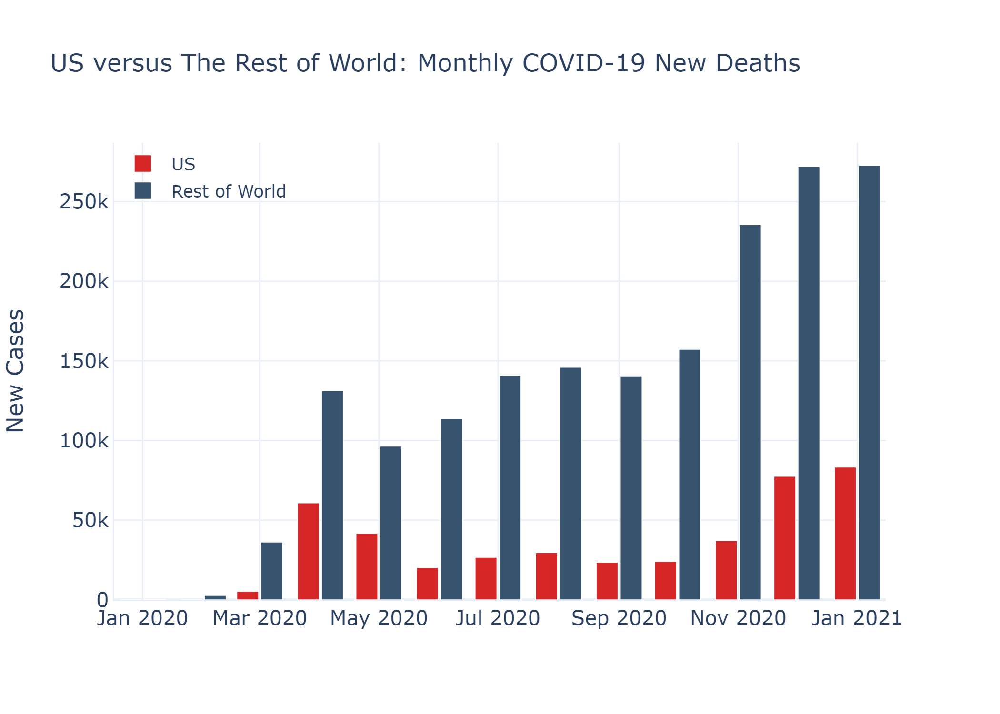

In [177]:
fig10 = go.Figure()
fig10.add_trace(go.Bar(x=[str(i) for i in us_df.groupby('Month-Year')['New Deaths'].sum().index],    # Add month
                      y=us_df.groupby('Month-Year')['New Deaths'].sum().values,
                      name="US",
                      marker_color='#d62728'))  # Add total monthly new cases 
fig10.add_trace(go.Bar(x=[str(i) for i in world_cases_all_time.groupby('Month-Year')['Rest of World New Deaths'].sum().index],
                      y=world_cases_all_time.groupby('Month-Year')['Rest of World New Deaths'].sum().values,
                      name="Rest of World",
                      marker_color='rgb(55, 83, 109)'))
fig10.update_layout(title='US versus The Rest of World: Monthly COVID-19 New Deaths',
                  xaxis_tickfont_size=14,
                  yaxis=dict(title='New Cases',
                            titlefont_size=16,
                            tickfont_size=14),
                  legend=dict(x=0, y=1.0,
                             bgcolor='rgba(255, 255, 255, 0)',
                             bordercolor='rgba(255, 255, 255, 0)'),
                  barmode='group', 
                  bargap =0.15,
                 bargroupgap=0.1)
#fig10.show()                       # interactive chart
pio.write_image(fig10, "US and The Rest New Deaths.png", format='png',scale=4)
Image(pio.to_image(fig10, format='png', scale=3))

## 4. How does the increase in daily deaths of the US compared to of the rest of the world?

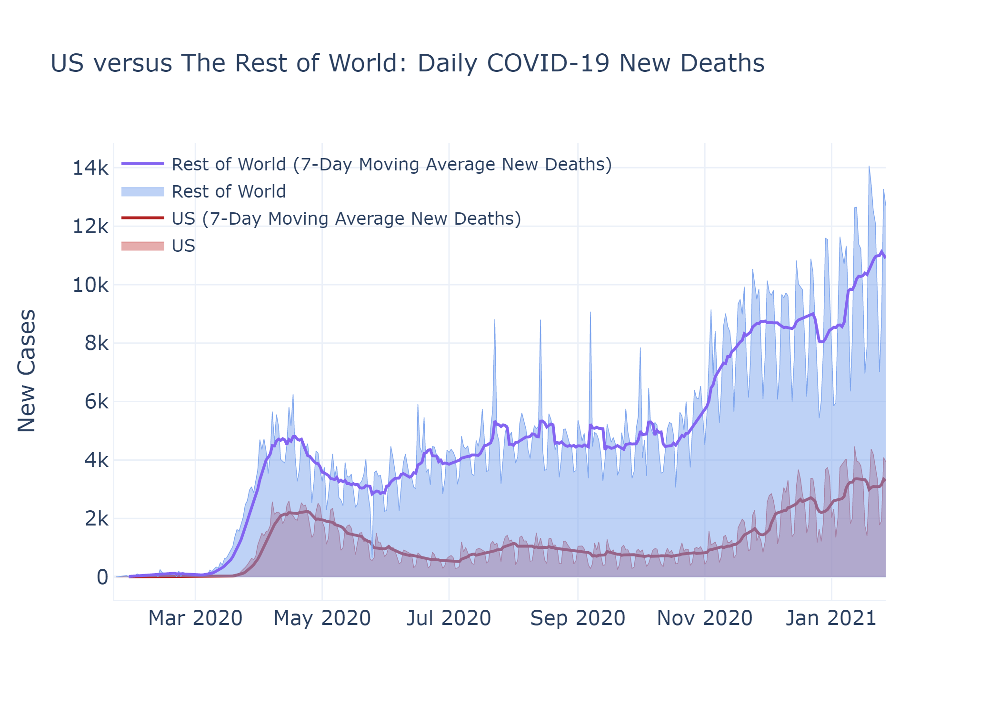

In [178]:
# AREA PLOT: US vs THE WORLD : DAILY COVID-19 NEW DEATHS
line_us1 = go.Figure() 

line_us1.add_trace(go.Scatter(x=us_df["Date"], y=us_df["New Deaths"],
                              fill='tonexty', name="US", line=dict(width=0.5, color='indianred')))

line_us1.add_trace(go.Scatter(x=us_df["Date"], y=us_df["7-Day Rolling Average New Deaths"],
                             line= dict(color='firebrick', width=2),
                             name="US (7-Day Moving Average New Deaths)"))

line_us1.add_trace(go.Scatter(x = world_cases_all_time["Date"], y=world_cases_all_time["Rest of World New Deaths"],
                              name="Rest of World", fill='tozeroy',line=dict(width=0.5, color='rgb(127, 166, 238)')))


line_us1.add_trace(go.Scatter(x= world_cases_all_time["Date"], y= world_cases_all_time["Rest of World 7-Day Rolling Average New Deaths"],
                             line= dict(color='rgb(131, 100, 241)', width=2),
                             name="Rest of World (7-Day Moving Average New Deaths)"))

line_us1.update_layout(title='US versus The Rest of World: Daily COVID-19 New Deaths',
                  xaxis_tickfont_size=14,
                  yaxis=dict(title='New Cases',
                            titlefont_size=16,
                            tickfont_size=14),
                  legend=dict(x=0, y=1.0,
                             bgcolor='rgba(255, 255, 255, 0)',
                             bordercolor='rgba(255, 255, 255, 0)'))

#line_us.show()
pio.write_image(line_us1, "US and The Rest New Deaths Daily.png", format='png',scale=4)
Image(pio.to_image(line_us1, format='png', scale=3))

## Vietnam Timeline Analysis

### How does the COVID-19 situation look like in Vietnam ?

  1. KDE (Kernal Density Estimate): Daily New Cases & Deaths Distribution.
  2. Bar Chart: Monthly Total New Cases and New Deaths in 
  3. Boxplot: Monthly New Cases & Deaths Distribution
  4. Line & Area Chart: 7 Days Rolling Average of Confirmed Cases, Deaths, New Cases, New Deaths Over Time.
  5. Heatmap: New Cases & Deaths for days of the month.
___________________________

## 1. KDE (Kernal Density Estimate): Daily New Cases & Deaths Distribution

In [85]:
# Country_data
print("Up till {}".format(final_date))
print("Vietnam has {} confirmed cases, {} deaths, and {}% fatality rate".\
      format(country_data[country_data['Country/Region']=='Vietnam']['Confirmed Cases'].iloc[0],
            country_data[country_data['Country/Region']=='Vietnam']['Deaths'].iloc[0],
            country_data[country_data['Country/Region']=='Vietnam']['fatality_rate'].iloc[0]))

Up till 01/27/2021
Vietnam has 1553 confirmed cases, 35 deaths, and 2.25% fatality rate


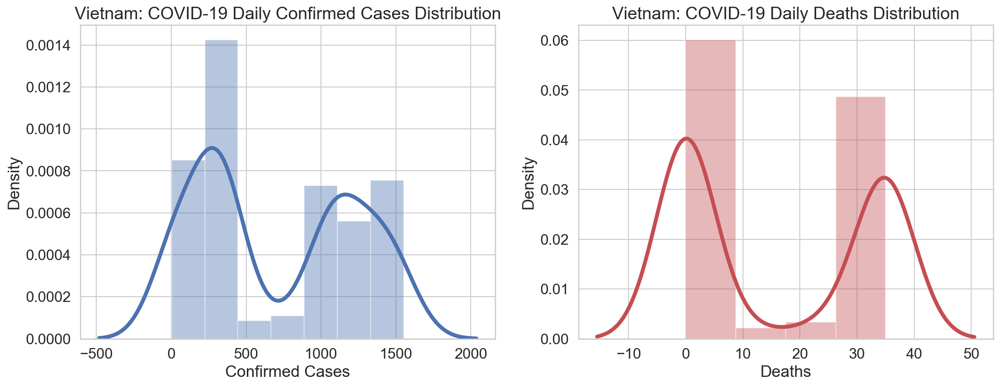

In [86]:
# KDE (Kernal Density Estimate) Plot: Visualize the distribution of observations in the dataset
# Set up charts configuration
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4,"axes.titlesize":18})
f, ax = plt.subplots(figsize=(17,6), ncols=2)

# Plot KDE VN daily new cases
sns.distplot(vn_df["Confirmed Cases"].iloc[1:], kde=True, ax=ax[0]),
ax[0].set_title("Vietnam: COVID-19 Daily Confirmed Cases Distribution")

# Plot KDE VN daily new deaths
sns.distplot(vn_df["Deaths"].iloc[1:], kde=True, ax=ax[1], color="r")
ax[1].set_title("Vietnam: COVID-19 Daily Deaths Distribution")

plt.show();

## 2. Bar Chart: Monthly Total New Cases and New Deaths in Vietnam

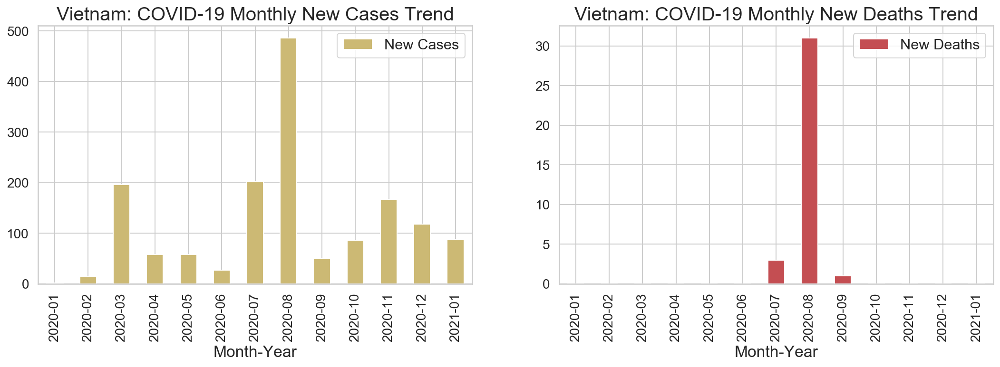

In [87]:
# BAR CHART: Plot total new cases in VN 
# Set up seaborn chart configuration
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4, "axes.titlesize":20})

# Set up matplotlib figure
f, ax = plt.subplots(figsize=(18,5), ncols=2, sharex=False)

# Convert Month-Year format to string
vn_df['Month-Year'] = vn_df['Month-Year'].apply(str)

# Plot US Monthly New Cases Trend
vn_df.groupby("Month-Year")['New Cases'].sum().plot(kind="bar",
    title="Vietnam: COVID-19 Monthly New Cases Trend", color="y", legend="True", fontsize=14, ax=ax[0])

# Plot US Monthly New Deaths Trend
vn_df.groupby("Month-Year")['New Deaths'].sum().plot(kind="bar",
    title="Vietnam: COVID-19 Monthly New Deaths Trend", color="r", legend="True", fontsize=14, ax=ax[1])
plt.show();

There was a spike in new infections and new deaths during August in Vietnam.

It happened because a tremendous number of international students came home from Europe or America (hotspots of the pandemic), and many foreigners decided to go to Vietnam to escape the pandemic in their country during the Summer. 


## 3. Boxplot: Monthly New Cases & Deaths Distribution

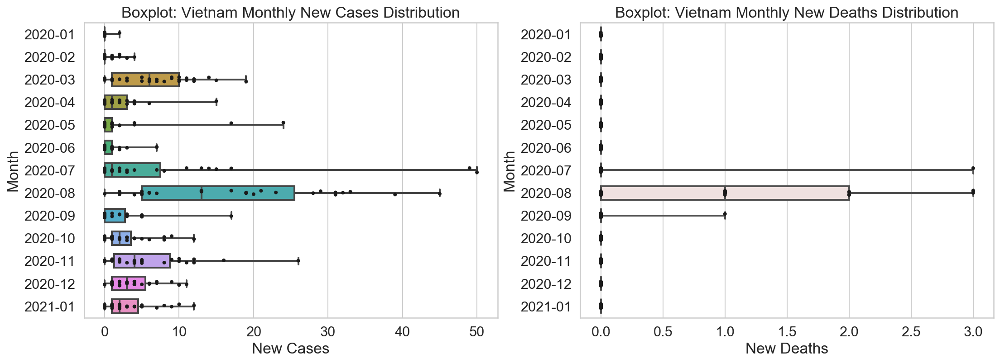

In [88]:
# BOXPLOT: DISTRIBUTION of NEW CASES AND DEATHS BY MONTH
# Set up the plot view
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":2, "axes.titlesize":17})
f, ax = plt.subplots(figsize=(18,6),ncols=2)

# Plot New Cases distribution by month in Vietnam
# Plot the orbital period with horizontal boxes
sns.boxplot(x="New Cases", y="Month-Year", data=vn_df, whis=[0,100], width=.6,ax=ax[0])

# Add in points to show each obersvation
sns.stripplot(x="New Cases", y="Month-Year", data=vn_df, size=4, color=".1", linewidth=0,ax=ax[0])

# Tweak the visual presentation
ax[0].xaxis.grid(True)
ax[0].set(ylabel="Month", title="Boxplot: Vietnam Monthly New Cases Distribution")

#Plot New Deaths distribution by month in Vietnam
# Plot the orbital period with horizontal boxes
sns.boxplot(x="New Deaths", y="Month-Year", data=vn_df, whis=[0,100], width=.6,ax=ax[1], palette="vlag")

# Add in points to show each obersvation
sns.stripplot(x="New Deaths", y="Month-Year", data=vn_df, size=4, color=".1", linewidth=0, ax=ax[1])

# TEak the visual presentation
ax[1].xaxis.grid(True)
ax[1].set(ylabel="Month", title="Boxplot: Vietnam Monthly New Deaths Distribution")

plt.show();

## 4. Line & Area Chart: 7 Days Rolling Average of Confirmed Cases, Deaths, New Cases, New Deaths Over Time.

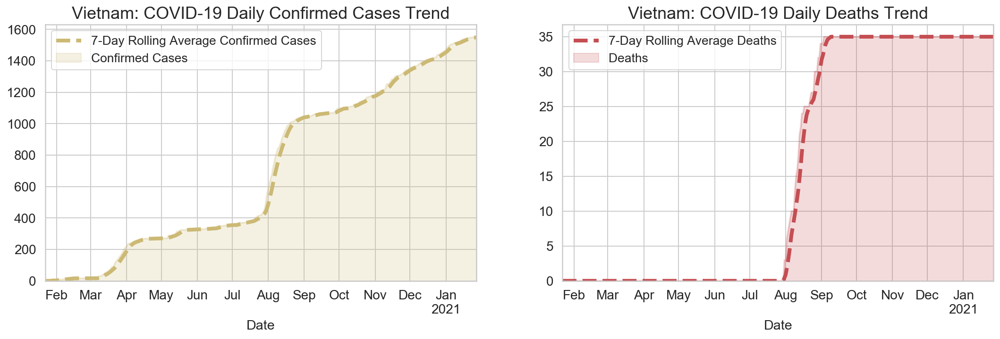

In [89]:
# # LINE & AREA CHARTS - CONFIRMED CASES & DEATHS
# Set up seaborn chart configuration
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth":2,"axes.titlesize":18})
# Set up matplotlib figure
f, ax = plt.subplots(figsize=(18,5), ncols=2, sharex=False)

# Plot VN Daily New Cases Trend
vn_df.groupby("Date")['7-Day Rolling Average Confirmed Cases'].sum().plot(kind="line",
         color="y", legend="True", fontsize=14, ax=ax[0],linestyle="dashed", linewidth=4)
vn_df.groupby("Date")['Confirmed Cases'].sum().plot(kind="area",
        title="Vietnam: COVID-19 Daily Confirmed Cases Trend", color="y", legend="True", alpha=.2, fontsize=14, ax=ax[0])
# Plot VN Daily New Deaths Trend
vn_df.groupby("Date")['7-Day Rolling Average Deaths'].sum().plot(kind="line", 
        color="r", legend="True", fontsize=14, ax=ax[1], linestyle="dashed", linewidth=4)
vn_df.groupby("Date")['Deaths'].sum().plot(kind="area", 
        title="Vietnam: COVID-19 Daily Deaths Trend", color="r", legend="True", alpha=.2, fontsize=14, ax=ax[1])
plt.show();

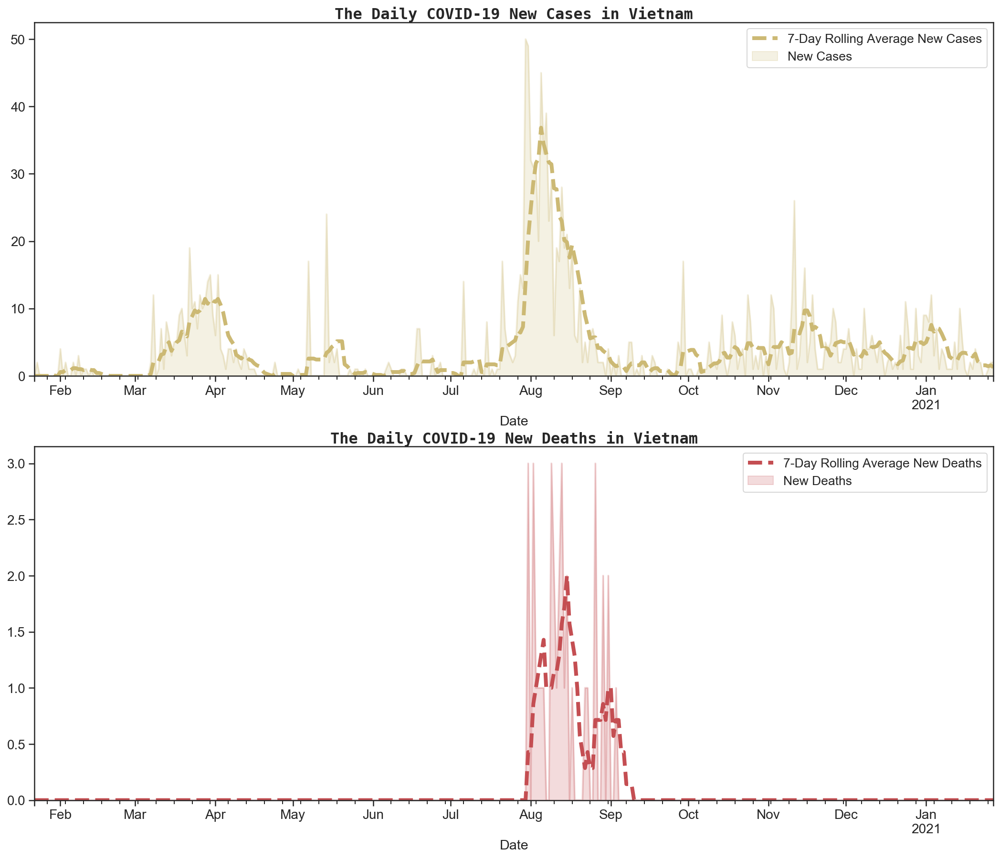

In [276]:
# LINE & AREA CHARTS - NEW CASES & DEATHS
# Set up seaborn chart configuration
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth":2, "axes.titlesize":20})
# Set up matplotlib figure
f, ax = plt.subplots(figsize=(18,15), nrows=2, sharex=False)
# Plot VN Daily New Cases Trend
vn_df.groupby("Date")['7-Day Rolling Average New Cases'].sum().plot(kind="line", color="y", legend="True", fontsize=14, ax=ax[0],
                                                                    linestyle="dashed", linewidth=4)
vn_df.groupby("Date")['New Cases'].sum().plot(kind="area",
        title="Vietnam: Daily COVID-19 New Cases Trend", color="y", legend="True", alpha=.2, fontsize=14, ax=ax[0])
# Plot VN Daily New Deaths Trend
vn_df.groupby("Date")['7-Day Rolling Average New Deaths'].sum().plot(kind="line", 
        color="r", legend="True", fontsize=14, ax=ax[1], linestyle="dashed", linewidth=4)
vn_df.groupby("Date")['New Deaths'].sum().plot(kind="area", 
        title="Vietnam: Daily COVID-19 New Deaths Trend", color="r", legend="True", alpha=.2, fontsize=14, ax=ax[1])
ax[0].set_title("The Daily COVID-19 New Cases in Vietnam", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)

ax[1].set_title("The Daily COVID-19 New Deaths in Vietnam", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)

plt.savefig('Vietnam New cases trend',dpi=200,bbox_inches='tight')
plt.show();


## 5. Heatmap: New Cases & Deaths for days of the month

It seems like the number of daily new cases in Vietnam are significantly high 

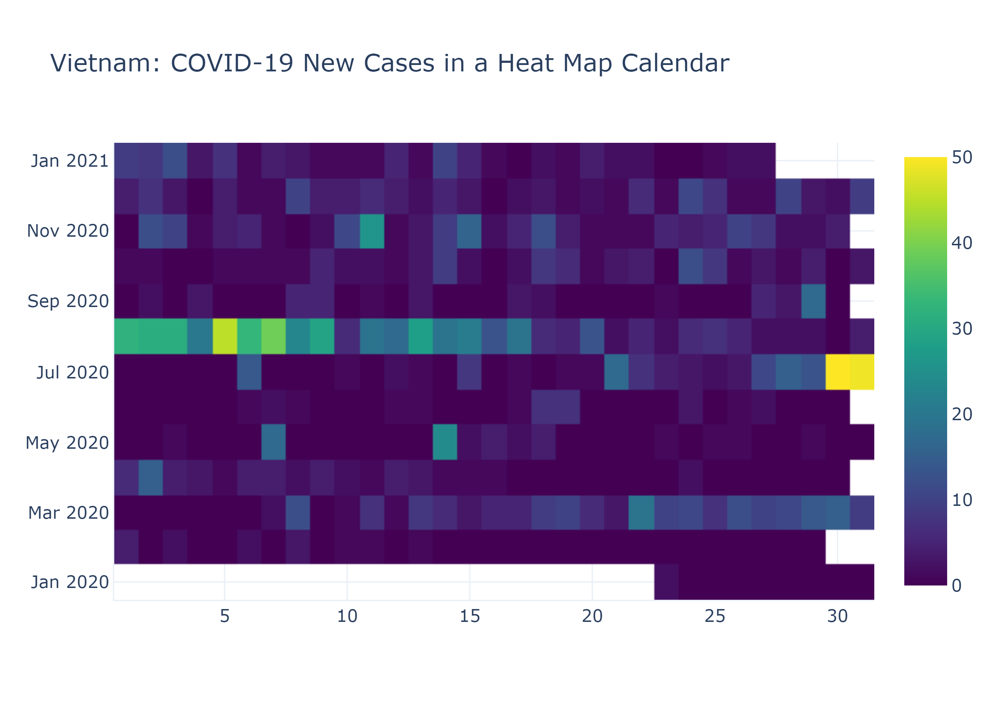

In [91]:
# Heatmap - demonstrate the number of new cases
vn_df['Day'] = vn_df['Day'].apply(str)
vn_df['Month-Year'] = vn_df['Month-Year'].apply(str)
fig5 = go.Figure(data=go.Heatmap( z=vn_df['New Cases'], x=vn_df['Day'], y=vn_df['Month-Year'],
        colorscale='Viridis'))
fig5.update_layout(title = 'Vietnam: COVID-19 New Cases in a Heat Map Calendar')
#fig5.show()
Image(pio.to_image(fig5, format='png', scale=4))

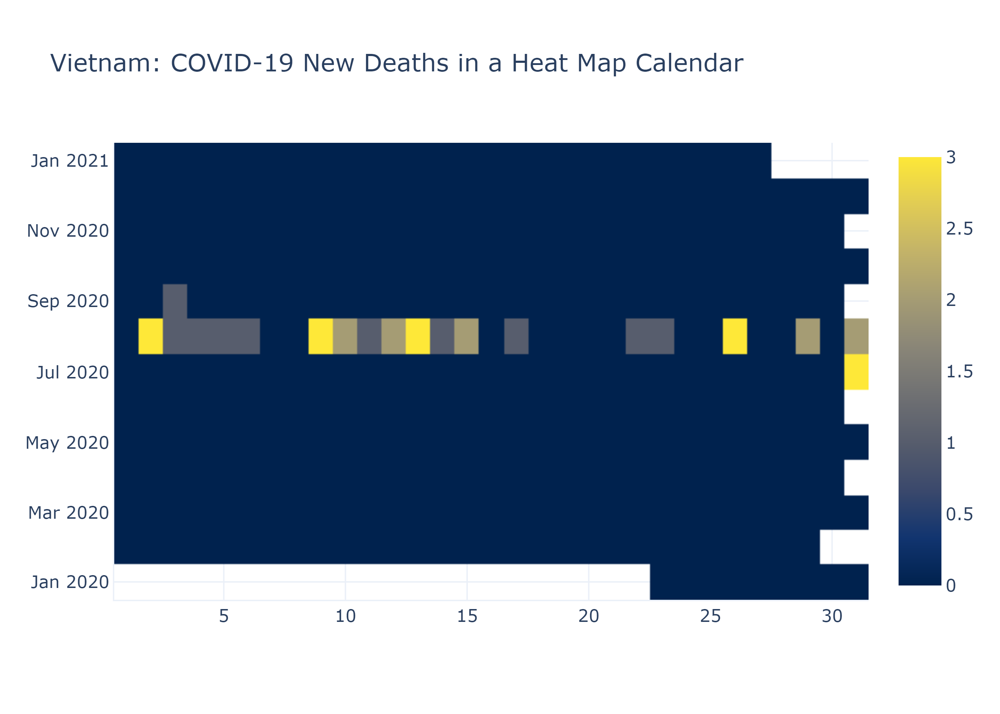

In [92]:
# Heatmap - demonstrate the number of new deaths
fig6 = go.Figure(data=go.Heatmap( z=vn_df['New Deaths'], x=vn_df['Day'], y=vn_df['Month-Year'],
        colorscale='Cividis'))
fig6.update_layout(title = 'Vietnam: COVID-19 New Deaths in a Heat Map Calendar')
#fig6.show()
Image(pio.to_image(fig6, format='png', scale=4))

# `Vietnam and USA Comparison`

### How does the pandemic situation in USA differ from that in Vietnam ?

 1. KDE New Cases Distribution
 2. KDE New Deaths Distribution
 3. Difference in number of new cases by Season & Month
 4. Daily New Cases Distribution by Season 
_________________________________________

In [93]:
# Merge Vietnam and US data
vn_us = pd.concat([vn_df,us_df])
#vn_us.head()

## 1. Vietnam vs US: Daily New Cases Distribution

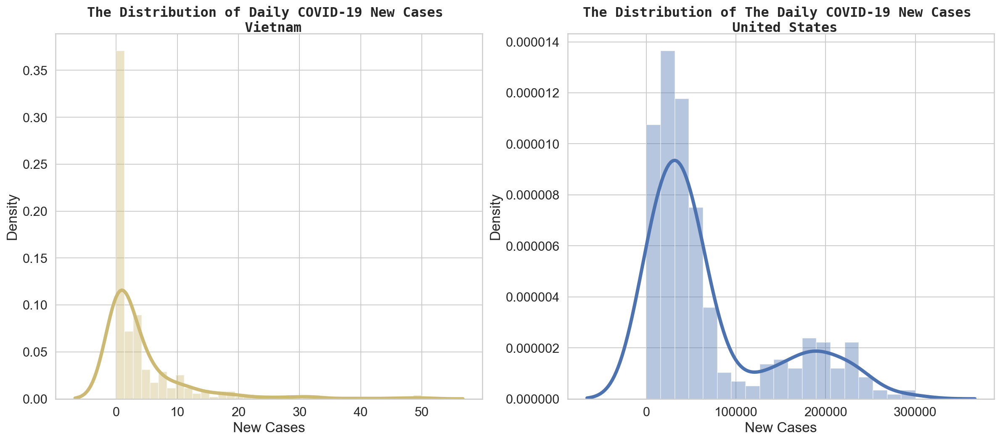

In [292]:
# KDE (Kernal Density Estimate) Plot: Visualize the distribution of observations in the dataset
# Set up the chart configuration
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4, "axes.titlesize":22})
f, ax = plt.subplots(figsize=(20,8), ncols=2)
# Plot KDE US new cases
sns.distplot(vn_df["New Cases"].iloc[1:], kde=True, ax=ax[0], color = "y")

# Plot KDE US new deaths
sns.distplot(us_df["New Cases"].iloc[1:], kde=True, ax=ax[1], color="b")

ax[0].set_title("The Distribution of Daily COVID-19 New Cases \n Vietnam", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)

ax[1].set_title("The Distribution of The Daily COVID-19 New Cases \n United States", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)
plt.savefig("usvnkde.png", dpi=200,bbox_inches='tight')
plt.show();

The Vietnam population (96.46M) is approximately one-third of the US population (328M), however, the daily new cases in US is 10,000 times higher than the daily new cases in Vietnam. Hence, Vietnam has successfully control of the pandemic in comparison with the U.S.



## 2. Vietnam vs US: Daily New Deaths Distribution



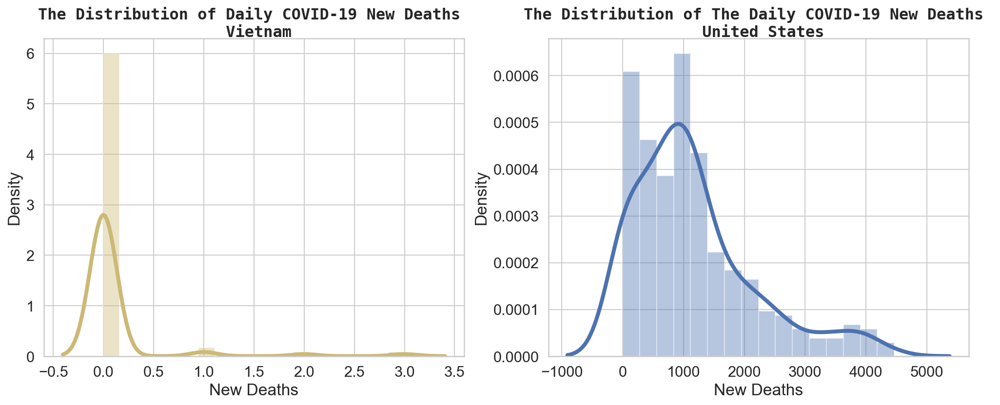

In [291]:
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.4, rc={"lines.linewidth":4, "axes.titlesize":22})
f, ax = plt.subplots(figsize=(17,6), ncols=2)
# Plot KDE VN new deaths
sns.distplot(vn_df["New Deaths"].iloc[1:], kde=True, ax=ax[0], color="y")

# Plot KDE US new deaths
sns.distplot(us_df["New Deaths"].iloc[1:], kde=True, ax=ax[1], color="b")

ax[0].set_title("The Distribution of Daily COVID-19 New Deaths \n Vietnam", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)

ax[1].set_title("The Distribution of The Daily COVID-19 New Deaths \n United States", 
             fontdict = {'fontsize':16,'fontweight':'bold'},
             loc='center', family='monospace', pad=2)
plt.savefig("usvnkded.png", dpi=200,bbox_inches='tight')

plt.show();

- Again, Vietnam barely had any daily new deaths during 2020 yet the daily new deaths in the U.S. are 1,000 times higher than the that in Vietnam.

## 3. Catplot: New Cases by Season & Month between U.S. and Vietnam


In [96]:
# Define a function to add season 
def season(month):
    if month in ([2,3,4]):
        season = "Spring"
    elif month in ([5,6,7]):
        season = "Summer"
    elif month in ([8,9,10]):
        season = "Fall"
    else:
        season = "Winter"
    return season

# Apply to add more season to vn and us
vn_df['season'] = vn_df["Month"].apply(lambda x:season(x)) # Add season to VN
us_df['season'] = us_df["Month"].apply(lambda x:season(x)) # Add season to US

<Figure size 432x288 with 0 Axes>

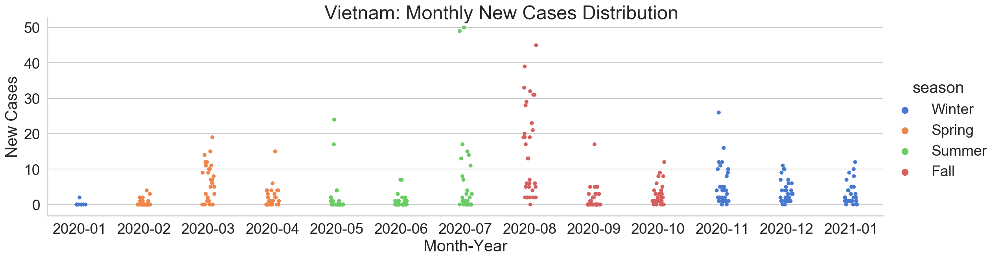

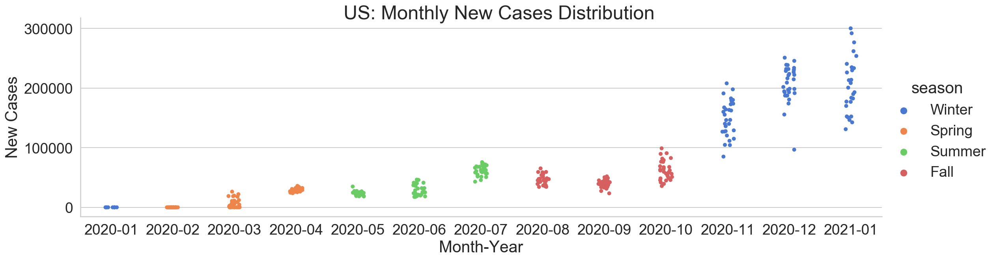

In [97]:
# Plot New Cases Distribution by Month
sns.set(style="whitegrid")
sns.color_palette("Paired")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth":4,
                                               "axes.titlesize":22})

plt.subplots_adjust(top=1)

# Plot new cases monthly by VN
g1 = sns.catplot(x="Month-Year", y="New Cases", hue="season", data=vn_df, 
                    height=4.5, aspect=3.5, palette="muted")
# Set title for VN chart
g1.fig.suptitle('Vietnam: Monthly New Cases Distribution'); 

# Plot new cases monthly by US
g2 = sns.catplot(x="Month-Year", y="New Cases", hue="season", data=us_df, 
                    height=4.5, aspect=3.5, palette="muted")
# Set title for US chart
g2.fig.suptitle('US: Monthly New Cases Distribution'); 

plt.show();

- Monthly new infections in the U.S. significantly increased from November 2020 to January 2021.
- Vietnam has successfully controlled the situation and kept the montly new cases less than 10.

## 4. New Cases Distribution by Season between Vietnam and U.S.

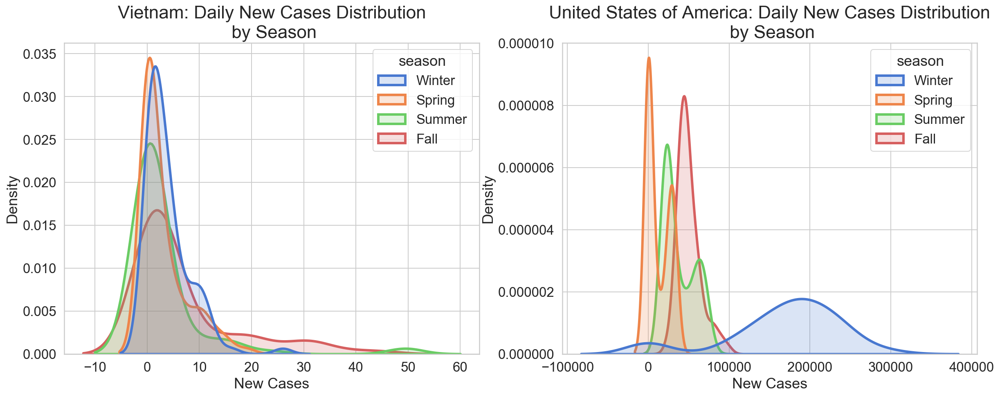

In [98]:
# Plot New Cases Distribution by Month

sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth":4,
                                               "axes.titlesize":22})

# Plot Vietnam new daily cases by season
fig, ax = plt.subplots(figsize=(20,7), ncols=2)
sns.kdeplot(data=vn_df.iloc[1:],
            x="New Cases", hue="season",
            fill="True", common_norm="False", palette="muted",
            hue_order=(["Winter", "Spring", "Summer", "Fall"]),
            alpha=.2, linewidth=3, ax=ax[0])
ax[0].set_title("Vietnam: Daily New Cases Distribution\n by Season")

# Plot the us new daily cases by season
sns.kdeplot(data=us_df.iloc[1:],
            x="New Cases", hue="season",
            fill="True", common_norm="False", palette="muted",
            hue_order=(["Winter", "Spring", "Summer", "Fall"]),
            alpha=.2, linewidth=3, ax=ax[1])
ax[1].set_title("United States of America: Daily New Cases Distribution\n by Season")

plt.show();

# The End.

This is my personal work and my own thoughts. I hope you enjoy reading this notebook and gain more insights about this pandemic around the world through visualization. Thank you for reading! :)


---
# <center> Part 2: Statistical & Hypothesis Testing Analysis </center>
---

This section is merged from `DA.ipynb` and includes:
* **Descriptive Statistics**
* **Hypothesis Testing** (fatality rate comparisons)
* **Correlation & Chi-Square Tests** (assessing dependencies)
* **Linear Regression Model** (fatality rate vs population size)



--- ---



# Statistical Analysis

# Descriptive Statistics

In [ ]:
# 1. Descriptive statistics
print("Descriptive Statistics:")
print(country_data.describe())
print("\n")

Descriptive Statistics:
       Confirmed Cases        Deaths  fatality_rate
count     2.010000e+02  2.010000e+02     201.000000
mean      3.365951e+06  3.423762e+04       4.472976
std       1.012228e+07  1.108256e+05      42.272578
min       1.000000e+00  0.000000e+00       0.000000
25%       3.749100e+04  3.720000e+02       0.516599
50%       3.173670e+05  3.164000e+03       1.075774
75%       1.704502e+06  1.907100e+04       1.918753
max       1.038027e+08  1.123836e+06     600.000000




In [ ]:
# Country_data
india_data = country_data.loc[country_data['Country/Region'] == 'India']
print("Up till {}".format(final_date))
print("India has {} confirmed cases, {} deaths, and {}% fatality rate".\
      format(india_data['Confirmed Cases'].iloc[0],
            india_data['Deaths'].iloc[0],
            india_data['fatality_rate'].iloc[0]))

Up till 03/09/2023
India has 44690738 confirmed cases, 530779 deaths, and 1.1876711456409603% fatality rate


# Hypothesis Test for Fatality Rate Comparison between India and Top-10 Fatality Rate Countries

In [ ]:
# 2. T-test (comparing fatality rates between India and Top-10 Fatality Rate Countries)
usa_data = country_data.loc[country_data['Country/Region'] == 'USA']

t_statistic, p_value = stats.ttest_ind(india_data['fatality_rate'].values, country_data['fatality_rate'].values, nan_policy='omit')
print("T-test for Fatality Rate:")
print("T-statistic:", t_statistic)
print("P-value:", p_value)
if p_value < 0.05:
    print("Reject the null hypothesis: There is a significant difference in fatality rates.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in fatality rates.")
print("\n")

T-test for Fatality Rate:
T-statistic: -0.0775245458721409
P-value: 0.9382837671308051
Fail to reject the null hypothesis: There is no significant difference in fatality rates.




### Correlation between Confirmed Cases and Deaths

In [ ]:
# 3. Correlation between confirmed cases and deaths
correlation = country_data['Confirmed Cases'].corr(country_data['Deaths'])
print("Correlation between Confirmed Cases and Deaths:")
print("Correlation coefficient:", correlation)
print("\n")

Correlation between Confirmed Cases and Deaths:
Correlation coefficient: 0.8766513715829531




### Chi-square test for Independence between Confirmed Cases and Deaths

In [ ]:
# 4. Chi-square test (testing independence between confirmed cases and deaths)
observed = country_data[['Confirmed Cases', 'Deaths']].values
chi2, p, dof, expected = stats.chi2_contingency(observed)
print("Chi-square test for Independence between Confirmed Cases and Deaths:")
print("Chi-square statistic:", chi2)
print("P-value:", p)
if p < 0.05:
    print("Reject the null hypothesis: Confirmed Cases and Deaths are dependent.")
else:
    print("Fail to reject the null hypothesis: Confirmed Cases and Deaths are independent.")

print("Variance of Fatality Rate :", country_data['fatality_rate'].var())

Chi-square test for Independence between Confirmed Cases and Deaths:
Chi-square statistic: 4208407.559601114
P-value: 0.0
Reject the null hypothesis: Confirmed Cases and Deaths are dependent.
Variance of Fatality Rate : 1786.970821550586


In [ ]:
# Read the Population Dataset
population = pd.read_csv('WorldPopulation2023.csv')
population.head()

,Rank,Country,Population2023,YearlyChange,NetChange,Density(P/Km²),Land Area(Km²),Migrants(net),Fert.Rate,MedianAge,UrbanPop%,WorldShare
0,36,Afghanistan,42239854,2.70 %,1111083,65,652860,-65846,4.4,17.0,26 %,0.53 %
1,138,Albania,2832439,-0.35 %,-9882,103,27400,-8000,1.4,38.0,67 %,0.04 %
2,34,Algeria,45606480,1.57 %,703255,19,2381740,-9999,2.8,28.0,75 %,0.57 %
3,212,American Samoa,43914,-0.81 %,-359,220,200,-790,2.2,29.0,N.A.,0.00 %
4,202,Andorra,80088,0.33 %,264,170,470,200,1.1,43.0,85 %,0.00 %


Linear Regression Analysis

### Linear Regression Analysis: Assessing the Dependency of Fatality Rate on Population

In [ ]:
import pandas as pd
import statsmodels.api as sm

population['Intercept'] = 1

# Merge country_data with population dataset based on country/region column
merged_data = pd.merge(country_data, population, left_on='Country/Region', right_on='Country', how='inner')

# Prepare the independent variables matri
X = merged_data[['Population2023', 'Intercept']]

# Define the dependent variable
y = merged_data['fatality_rate']

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          fatality_rate   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.5757
Date:                Mon, 29 Apr 2024   Prob (F-statistic):              0.449
Time:                        10:56:21   Log-Likelihood:                -357.21
No. Observations:                 184   AIC:                             718.4
Df Residuals:                     182   BIC:                             724.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Population2023  6.246e-10   8.23e-10      0.

# Significance of Coefficients in Linear Regression Analysis

In [ ]:
# Print the significance of coefficients
print("\nSignificance of Coefficients:")
print("Population2023 p-value:", model.pvalues['Population2023'])
print("Intercept p-value:", model.pvalues['Intercept'])

# Interpretation of p-values
if model.pvalues['Population2023'] > 0.05:
    print("The coefficient for Population2023 is not statistically significant.")
else:
    print("The coefficient for Population2023 is statistically significant.")

if model.pvalues['Intercept'] > 0.05:
    print("The Intercept is not statistically significant.")
else:
    print("The Intercept is statistically significant.")


Significance of Coefficients:
Population2023 p-value: 0.44898829847694266
Intercept p-value: 2.6486653719584404e-21
The coefficient for Population2023 is not statistically significant.
The Intercept is statistically significant.
